# all_responses.ipynb

---

These first few charts are not executed in linear order. I pulled them up from the bottom.

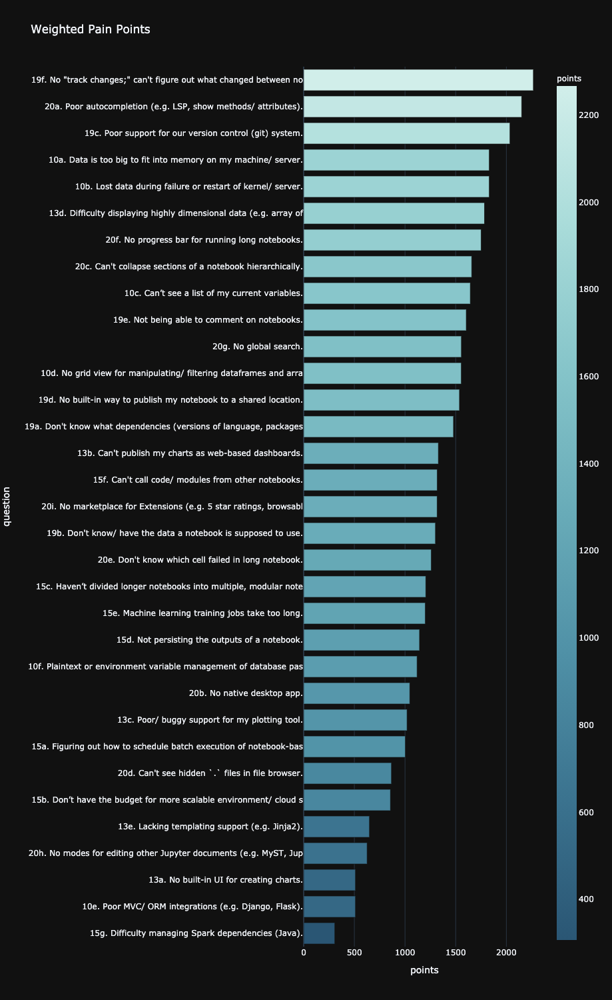

In [329]:
px.bar(weighted_df, x='points', y='question', title='Weighted Pain Points', height=1500, width=900, **points_color_kwargs)

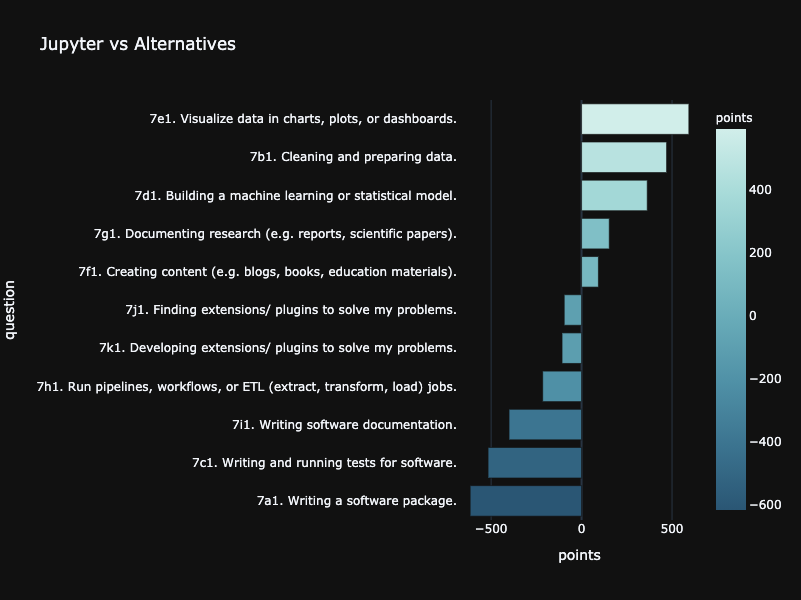

In [404]:
px.bar(compt_df, x='points', y='question', title='Jupyter vs Alternatives', height=600, width=800, **points_color_kwargs)

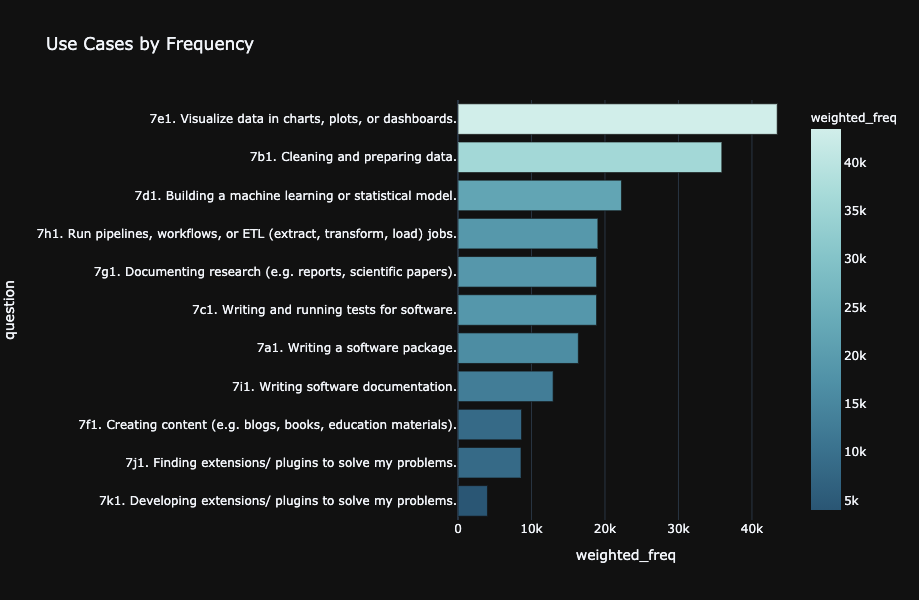

In [381]:
px.bar(freq_df, x='weighted_freq', y='question', title='Use Cases by Frequency', height=600, width=800, **freq_color_kwargs)

## Main takeaways

1. (q3-7) Sound familiar? Predominantly used by data scientists, researchers, and academics using Python for visualization, data wrangling, documenting research [<- needs improvement], and ML.

2. (q19-20) Extreme pain points: autocompletion, version control, track changes.

3. (q18c) Collaborators are either working on different parts of a project or entirely separate projects.

4. (q18-q19) People want to **publish to shared location** in order to **share knowledge** [see RStudio Server].

5. (q14) Most people either scale vertically or don't know how to scale.

6. (q15) The pain points raised in scale, data, and collaboration seem addressable.

7. (q6) Usage: Local machine/ venv > Google Colab > JupyterHub > HPC > Docker.

8. (q3) Keep an eye on: Julia already half as popular as R and almost matching SQL. Dask as popular as Spark.


### (q7) What are the most frequent use cases?

* Frequent: viz, data wrangling, documenting research, ML.
* Often: writing sftw, pipelines, tests, documentation.
* Infrequent: content creation, find ext, dev ext.

  * Expected more wrangling and pipelines.(worse than alts)
  * Expected less ML. 


### (q7) Where is Jupyter better/ worse than alternative tools?

* Better: viz, data wrangling, ML.
* Tossup: content creation, find ext, documenting research.
* Worse: writing sftw, tests, docs, pipelines, dev ext.

    * Expected Jupyter to be better at "documenting research."
      * Great area for UX interviews.
    * Surprised that ML ranked well. Maybe it's the tensorboard extensions.


---

## Question-by-question insight

* Usage:
	* Majority of particpants are longtime, frequent users.
	* Big dropoff between monthly and weekly.
  		
  		* => Subset monthly and no longer use?


* Languages:
  * Python dominant with longtail distribution.
  * Julia is already half strength of R.
  * Scala used less than Javascript.

    * Expected more R.
    * Expected more Spark.


* Role:
  * 1st category: data sci and data engineer
  * 2nd category: student, teacher, tutor


* IDE:
  * Evenly distributed competition.
  * Strong VIM and IPython showing.
  * No Zeppelin love.


* Env:
  * Longtail skewed toward local machine and venv.
  * Half of users using colab!
  * JupyterHub more popular than HPCs!

* Data sources:
  * Didn't expect so much SQL.
  * More S3 than EC2 usage.
  * Moderate Google Sheets usage (maybe due to Colab?)


* Data formats:
  * Tabular longtail.
  * Lots of Nested (JSON... why?) and Time Series data.
  * Decent image use, but expected more.


* Pain points - data:
  * High: memory, data loss
  * Med: secrets, grid view, variable explorer
  * Low: mvc/ orm

    * However, Reddit unanimously demanded variable explorer.


* Type of analysis:
  * Expected less of everything
  * Expected less NLP, feat.eng., graphs, dim.reduc. 


* Dashboards:
  * Most people aren't creating dashboards.
  * Those who do are mostly using plotly or manually.
  * Moderate app usage (grafana, Tableau).
  * More R Shiny usage than Voila.


* Pain points - viz:
  * High: data dimensionality
  * Med: chart publisher, tool support
  * Low: chart creator, templating


* Scale:
	* No cluster is dominant. 
	* Either machine, regular EC2, or lost.
	* Surprisingly high Dask usage.
	* Airflow as popular as Spark.
	* Expected more Sagemaker/ Watson.
	* Little Jupyter Enterprise Gateway usage.
	* Expected more Kubeflow and Horovod.


* Pain points - scale:
  * High: 
  * Med: long notebooks, peristing output, modular, ML train
  * Low: batch, budget, spark

  	* All medium pain points are solveable
  	* Expected batch to be a bigger problem.
  	

* Sharing:
  * Longtail on knowledge/ teaching.
  * Moderate code collaboration.


* Collaborations:
  * Mostly longstanding and frequent interactions.
  * But ppl working on diff pieces of the project or diff projects.


* Pain points - Collaboration:
  * High: VERSION CONTROL, publish to shared location, comments, track changes
  * Med: data source, dependency mgmt, 
  * Low: 


* Pain points - UI:
  * High: LSP, 
  * Med: collapse, progress bar, global search,
  * Low: desktop app, hidden files, finding failed cells, edit other docs.

    * Redditors wanted a desktop app ("so oldschool").
    * Edit myst may solve documenting research problem.

---

In [7]:
import pandas as pd
import plotly.express as px
import plotly.graph_objects as go

#### 215 data points gathered.

In [8]:
df = pd.read_csv('data/all_responses.csv')

In [9]:
len(df.columns.tolist()) - 1 #'Respondent ID'

215

#### Helper functions.

In [10]:
def series_counts_to_frame(main_df:object, col_name:object):
    col_series = main_df[col_name]
    frame = col_series.value_counts().to_frame()
    frame = frame.rename(columns={col_name:'count'})
    
    frame[col_name] = frame.index
    frame = frame.rename(columns={col_name:'options'})
    frame = frame.reset_index(drop=True)
    
    return frame

In [11]:
counts_color_kwargs = dict(
    template='plotly_dark', color='count',
    color_continuous_scale=px.colors.sequential.Teal[::-1], 
)

In [12]:
points_color_kwargs = dict(
    template='plotly_dark', color='points',
    color_continuous_scale=px.colors.sequential.Teal[::-1], 
)

In [371]:
freq_color_kwargs = dict(
    template='plotly_dark', color='weighted_freq',
    color_continuous_scale=px.colors.sequential.Teal[::-1], 
)

In [13]:
compare_color_kwargs = dict(
    color='tool', template='plotly_dark', height=300,
    color_discrete_sequence=['lightblue','salmon']
)

---

# Survey Questions

In [14]:
q1_name = '1. How frequently do you use Jupyter?'

In [15]:
q1 = series_counts_to_frame(main_df=df, col_name=q1_name)
q1 = q1.iloc[::-1]

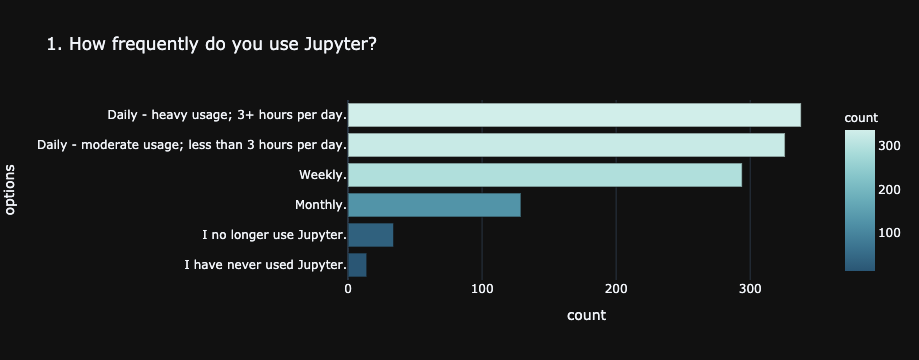

In [16]:
px.bar(q1, x='count', y='options', title=q1_name, height=350, **counts_color_kwargs)

---

In [17]:
q2_name = '2. How long have you been using Jupyter?'

In [18]:
q2 = series_counts_to_frame(main_df=df, col_name=q2_name)
q2 = q2.reindex([4, 2, 3, 1, 0])

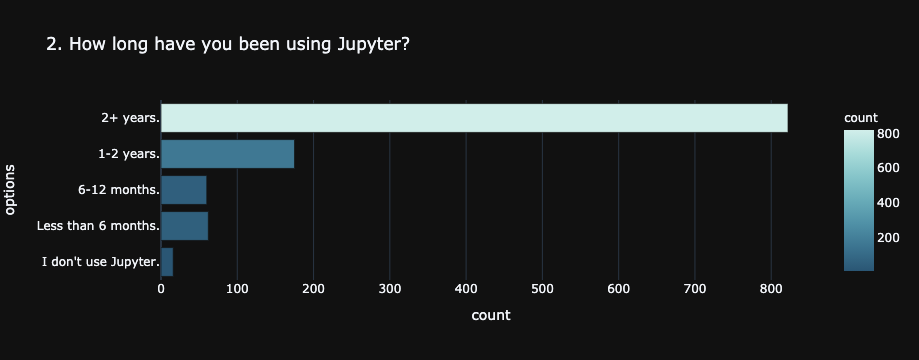

In [19]:
px.bar(q2, x='count', y='options', title=q2_name, height=350, **counts_color_kwargs)

---

In [20]:
q3_name = '3. What languages do you use in Jupyter? (pick up to 4)'

In [21]:
cols_3 = [col for col in df.columns.tolist() if col.startswith('3.')]

In [22]:
counts_3_records = []

In [23]:
for col in cols_3:
    count = df[col].count()
    col = col.split("3. ", 1).pop()
    record = {"language":col, "count":count}
    counts_3_records.append(record)

In [24]:
counts_3_df = pd.DataFrame.from_records(counts_3_records).sort_values('count')

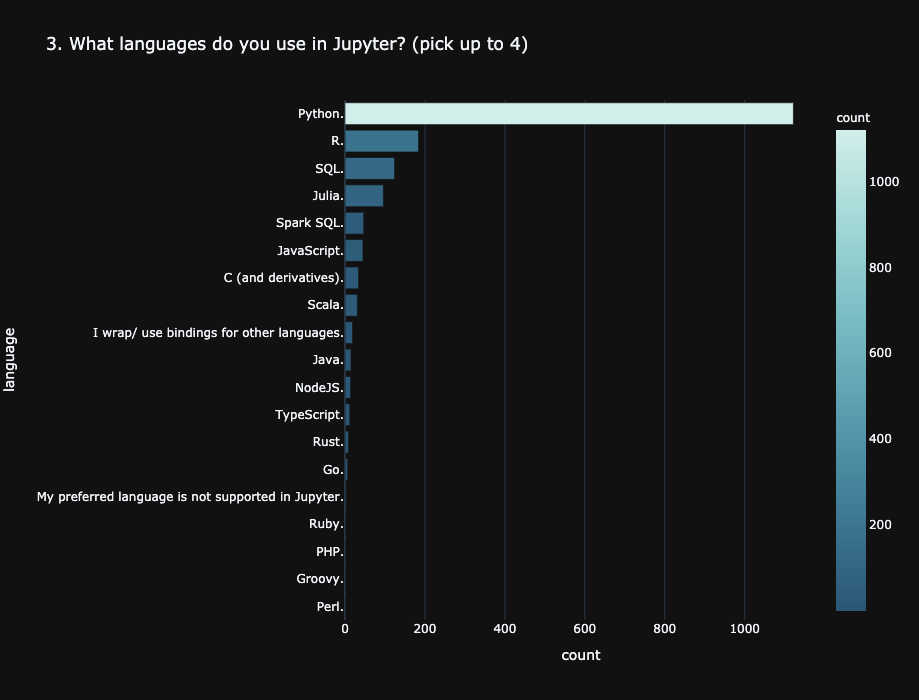

In [25]:
px.bar(counts_3_df, x='count', y='language', title=q3_name, height=700, **counts_color_kwargs)

---

In [26]:
q4_name = '4. What are your primary job roles when you are using Jupyter? (pick up to 2)'

In [27]:
cols_4 = [col for col in df.columns.tolist() if col.startswith('4.')]

In [28]:
counts_4_records = []

In [29]:
for col in cols_4:
    count = df[col].count()
    col = col.split("4. ", 1).pop()
    record = {"role":col, "count":count}
    counts_4_records.append(record)

In [30]:
counts_4_df = pd.DataFrame.from_records(counts_4_records).sort_values('count')

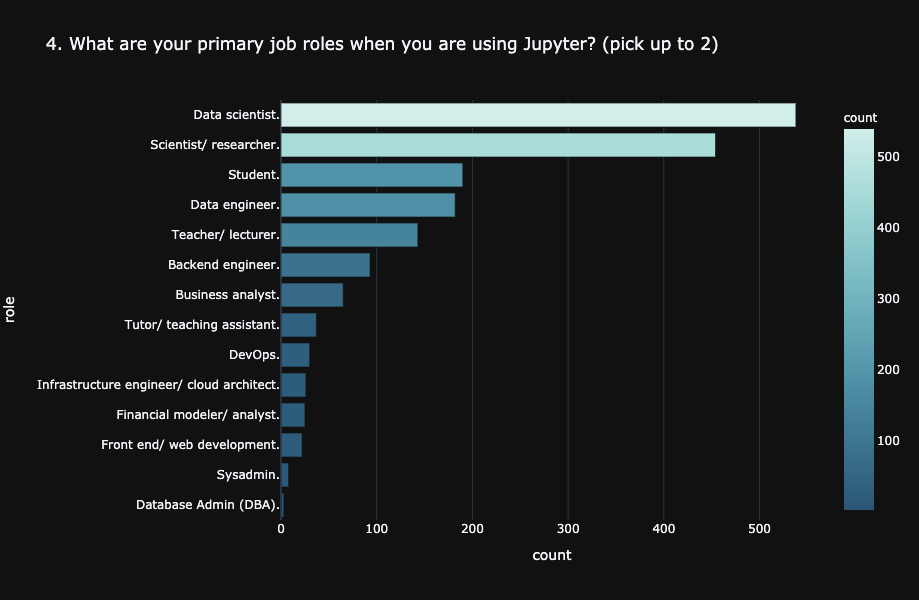

In [31]:
px.bar(counts_4_df, x='count', y='role', title=q4_name, height=600, **counts_color_kwargs)

---

In [32]:
q5_name = "5. What are your go-to tools for performing data science, scientific computing, and machine learning on your laptop/ desktop (non-cloud) for data science? (pick up to 3)"

In [33]:
cols_5 = [col for col in df.columns.tolist() if col.startswith('5.')]

In [34]:
counts_5_records = []

In [35]:
for col in cols_5:
    count = df[col].count()
    col = col.split("5. ", 1).pop()
    record = {"ide":col, "count":count}
    counts_5_records.append(record)

In [36]:
counts_5_df = pd.DataFrame.from_records(counts_5_records).sort_values('count')

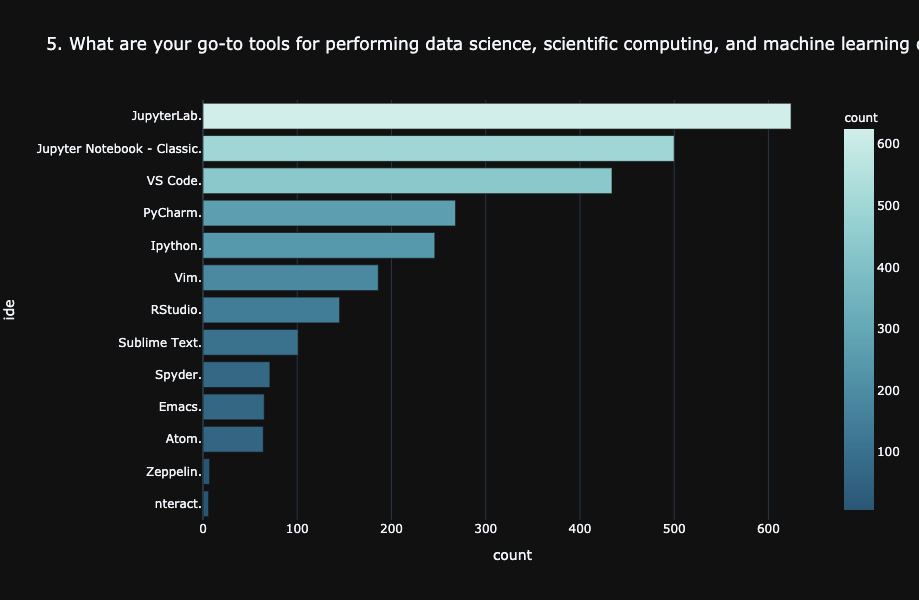

In [37]:
px.bar(counts_5_df, x='count', y='ide', title=q5_name, height=600, **counts_color_kwargs)

---

In [38]:
q6_name = '6. How do you run and/ or access Jupyter? (pick up to 4)'

In [39]:
cols_6 = [col for col in df.columns.tolist() if col.startswith('6.')]

In [40]:
counts_6_records = []

In [41]:
for col in cols_6:
    count = df[col].count()
    col = col.split("6. ", 1).pop()
    record = {"env":col, "count":count}
    counts_6_records.append(record)

In [42]:
counts_6_df = pd.DataFrame.from_records(counts_6_records).sort_values('count')

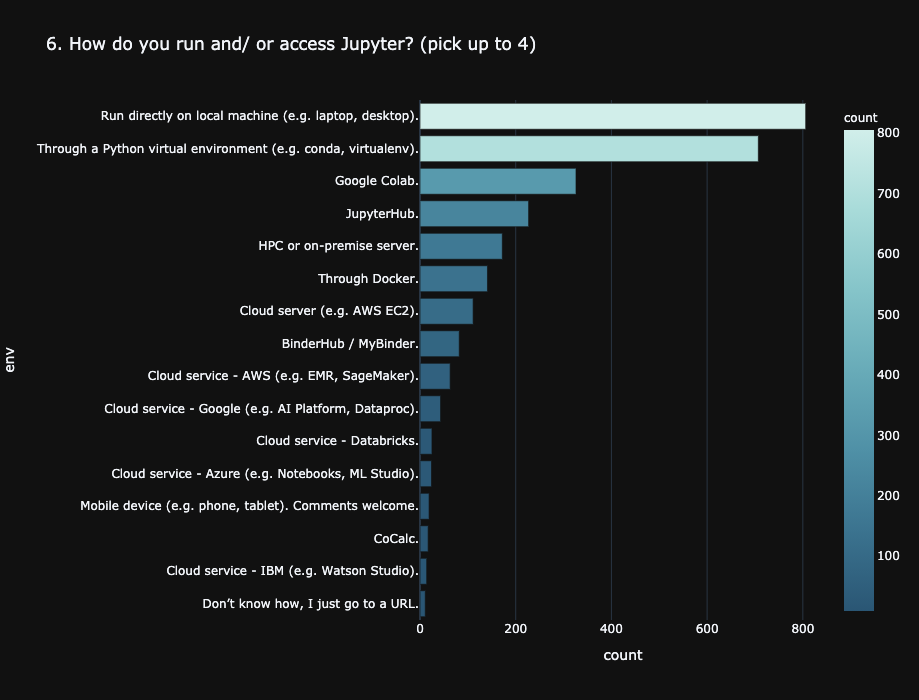

In [43]:
px.bar(counts_6_df, x='count', y='env', title=q6_name, height=700, **counts_color_kwargs)

---

In [44]:
def merge_expectations(df2, df3):
    jupyter = ['jupyter', 'jupyter', 'jupyter', 'jupyter']
    alternative = ['alternative', 'alternative', 'alternative', 'alternative']
    
    df2['tool'] = jupyter
    df3['tool'] = alternative
    
    merged_df = df2.append(df3, ignore_index=True)
    return merged_df

---

In [45]:
q7a1_name = '7a1. Writing a software package. - How frequently do you\xa0perform this task?'

In [46]:
q7a1 = series_counts_to_frame(main_df=df, col_name=q7a1_name)
q7a1 = q7a1.reindex([0, 1, 3, 2, 4])

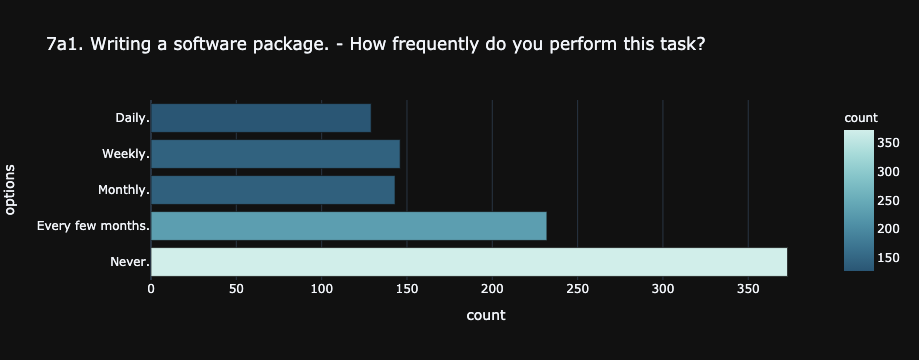

In [47]:
px.bar(q7a1, x='count', y='options', title=q7a1_name, height=300, **counts_color_kwargs)

In [48]:
q7a2_name = '7a2. Writing a software package. - Has Jupyter met your expectations for this use case?'

In [49]:
q7a3_name = '7a3. Writing a software package. - Have alternative tools met your expectations for this use case?'

In [50]:
q7a2 = series_counts_to_frame(main_df=df, col_name=q7a2_name)
q7a2 = q7a2.reindex([0, 1, 2, 3])

In [51]:
q7a3 = series_counts_to_frame(main_df=df, col_name=q7a3_name)
q7a3 = q7a3.reindex([1,3,2,0])

In [52]:
q7a_merged = merge_expectations(q7a2, q7a3)

In [53]:
q7a_name = '7a. Writing a software package. Meets expectations.'

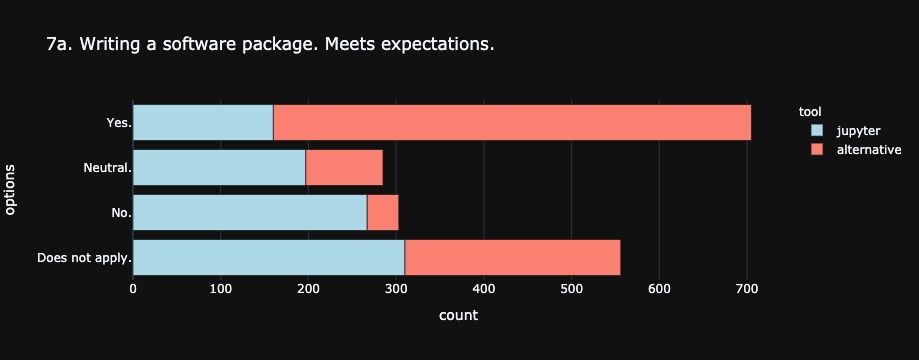

In [54]:
px.bar(q7a_merged, x='count', y='options', title=q7a_name, **compare_color_kwargs)

---

In [55]:
q7b1_name = '7b1. Cleaning and preparing data. - How frequently do you perform this task?'

In [56]:
q7b1 = series_counts_to_frame(main_df=df, col_name=q7b1_name)
q7b1 = q7b1.reindex([4,3,2,0,1])

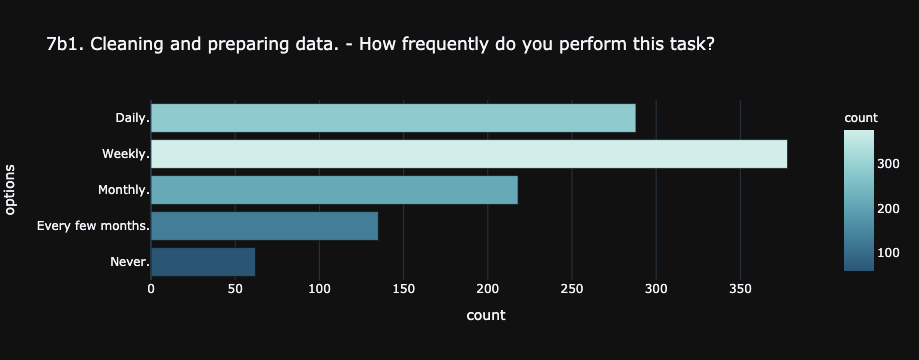

In [57]:
px.bar(q7b1, x='count', y='options', title=q7b1_name, height=300, **counts_color_kwargs)

In [58]:
q7b2_name = '7b2. Cleaning and preparing data. - Has Jupyter met your expectations for this use case?'

In [59]:
q7b2 = series_counts_to_frame(main_df=df, col_name=q7b2_name)
q7b2 = q7b2.reindex([2, 3, 1, 0])

In [60]:
q7b3_name = '7b3. Cleaning and preparing data. - Have alternative tools met your expectations for this use case?'

In [61]:
q7b3 = series_counts_to_frame(main_df=df, col_name=q7b3_name)
q7b3 = q7b3.reindex([3, 2, 1, 0])

In [62]:
q7b_merged = merge_expectations(q7b2, q7b3)

In [63]:
q7b_name = '7b. Cleaning & preparing data. Meets expectations.'

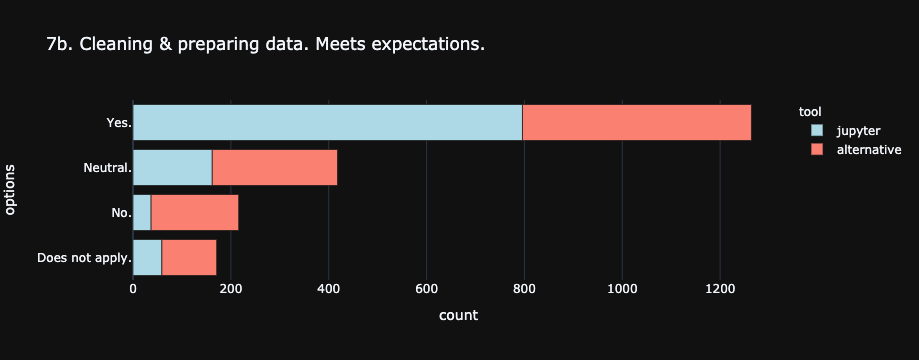

In [64]:
px.bar(q7b_merged, x='count', y='options', title=q7b_name, **compare_color_kwargs)

---

In [65]:
q7c1_name = '7c1. Writing and running tests for software. - How frequently do you\xa0perform this task?'

In [66]:
q7c1 = series_counts_to_frame(main_df=df, col_name=q7c1_name)
q7c1 = q7c1.reindex([0, 1, 3, 2, 4])

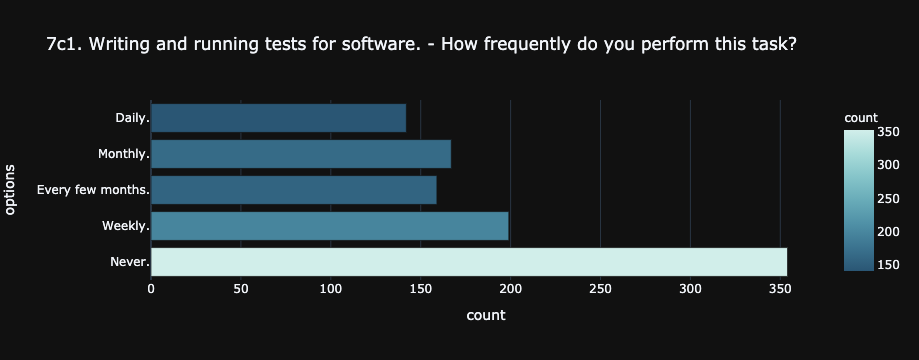

In [67]:
px.bar(q7c1, x='count', y='options', title=q7c1_name, height=300, **counts_color_kwargs)

In [68]:
q7c2_name = '7c2. Writing and running tests for software. - Has Jupyter met your expectations for this use case?'

In [69]:
q7c2 = series_counts_to_frame(main_df=df, col_name=q7c2_name)
q7c2 = q7c2.reindex([0, 1, 3, 2])

In [70]:
q7c3_name = '7c3. Writing and running tests for software. - Have\xa0alternative tools met your expectations for this use case?'

In [71]:
q7c3 = series_counts_to_frame(main_df=df, col_name=q7c3_name)
q7c3 = q7c3.reindex([1, 3, 2, 0])

In [72]:
q7c_name = '7c. Writing and running tests for software. Meets expectations.'

In [73]:
q7c_merged = merge_expectations(q7c2, q7c3)

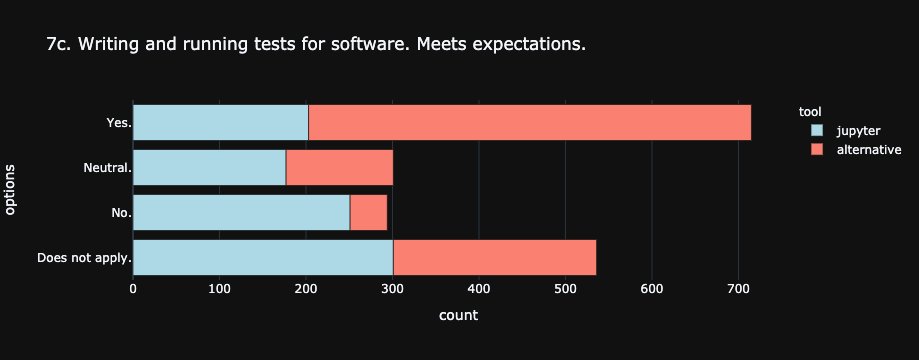

In [74]:
px.bar(q7c_merged, x='count', y='options', title=q7c_name, **compare_color_kwargs)

---

In [75]:
q7d1_name = '7d1. Building a machine learning or statistical model. - How frequently do you\xa0perform this task?'

In [76]:
q7d1 = series_counts_to_frame(main_df=df, col_name=q7d1_name)
q7d1 = q7d1.reindex([3, 1, 2, 0, 4])

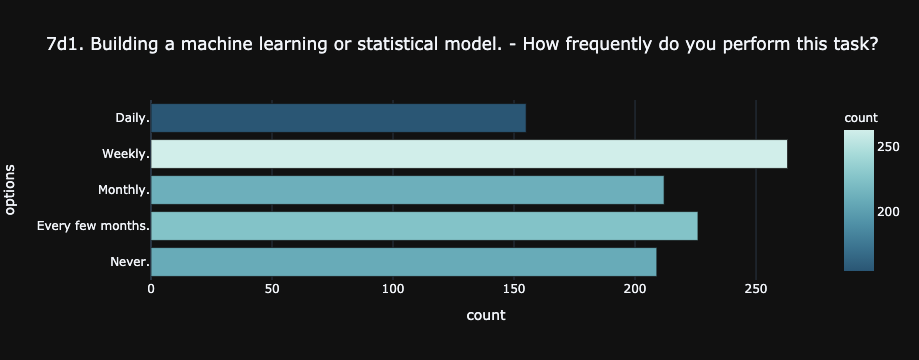

In [77]:
px.bar(q7d1, x='count', y='options', title=q7d1_name, height=300, **counts_color_kwargs)

In [78]:
q7d2_name = '7d2. Building a machine learning or statistical model. - Has Jupyter met your expectations for this use case?'

In [79]:
q7d2 = series_counts_to_frame(main_df=df, col_name=q7d2_name)
q7d2 = q7d2.reindex([2,3,1,0])

In [80]:
q7d3_name = '7d3. Building a machine learning or statistical model. - Have\xa0alternative tools met your expectations for this use case?'

In [81]:
q7d3 = series_counts_to_frame(main_df=df, col_name=q7d3_name)
q7d3 = q7d3.reindex([2,3,1,0])

In [82]:
q7d_name = '7d. Building a machine learning or statistical model. Meets expectations.'

In [83]:
q7d_merged = merge_expectations(q7d2, q7d3)

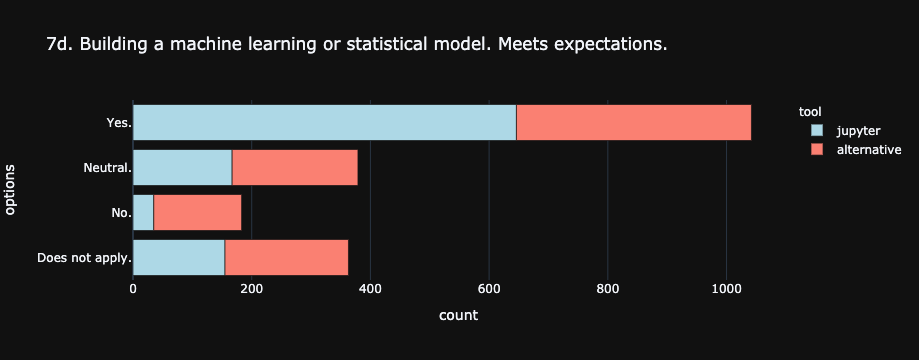

In [84]:
px.bar(q7d_merged, x='count', y='options', title=q7d_name, **compare_color_kwargs)

---

In [85]:
q7e1_name = '7e1. Visualize data in charts, plots, or dashboards. - How frequently do you\xa0perform this task?'

In [86]:
q7e1 = series_counts_to_frame(main_df=df, col_name=q7e1_name)
q7e1 = q7e1.reindex([4, 3, 2, 0, 1])

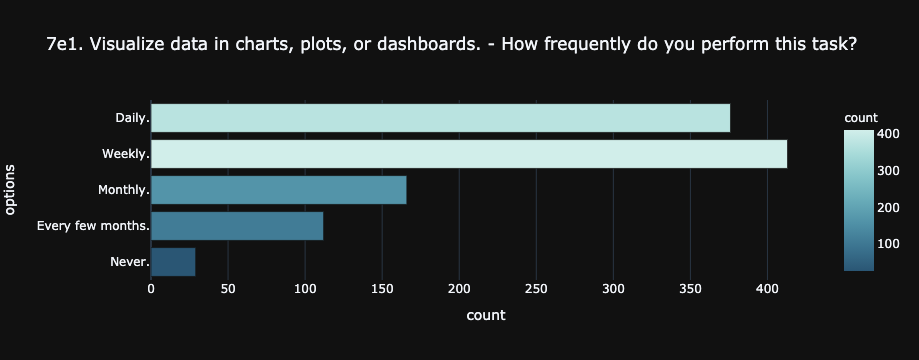

In [87]:
px.bar(q7e1, x='count', y='options', title=q7e1_name, height=300, **counts_color_kwargs)

In [88]:
q7e2_name ='7e2. Visualize data in charts, plots, or dashboards. - Has Jupyter met your expectations for this use case?'

In [89]:
q7e2 = series_counts_to_frame(main_df=df, col_name=q7e2_name)
q7e2 = q7e2.reindex([2,3,1,0])

In [90]:
q7e3_name = '7e3. Visualize data in charts, plots, or dashboards. - Have\xa0alternative tools met your expectations for this use case?'

In [91]:
q7e3 = series_counts_to_frame(main_df=df, col_name=q7e3_name)
q7e3 = q7e3.reindex([3, 2, 1, 0])

In [92]:
q7e_name = '7e. Visualize data in charts, plots, or dashboards. Meets expectations.'

In [93]:
q7e_merged = merge_expectations(q7e2, q7e3)

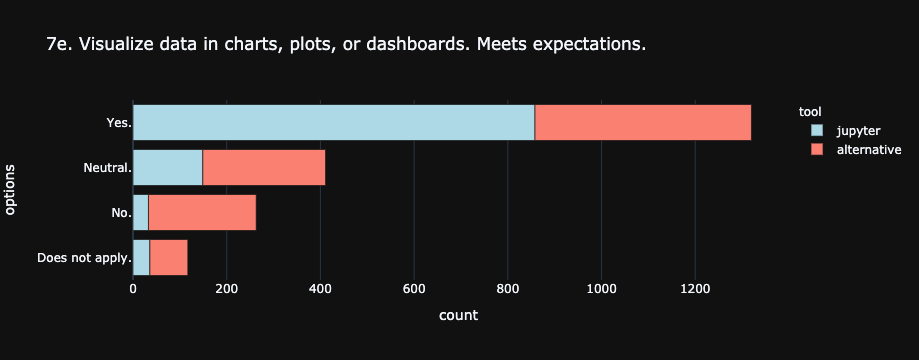

In [94]:
px.bar(q7e_merged, x='count', y='options', title=q7e_name, **compare_color_kwargs)

---

In [95]:
q7f1_name = '7f1. Creating content (e.g. blogs, books, education materials). - How frequently do you\xa0perform this task?'

In [96]:
q7f1 = series_counts_to_frame(main_df=df, col_name=q7f1_name)

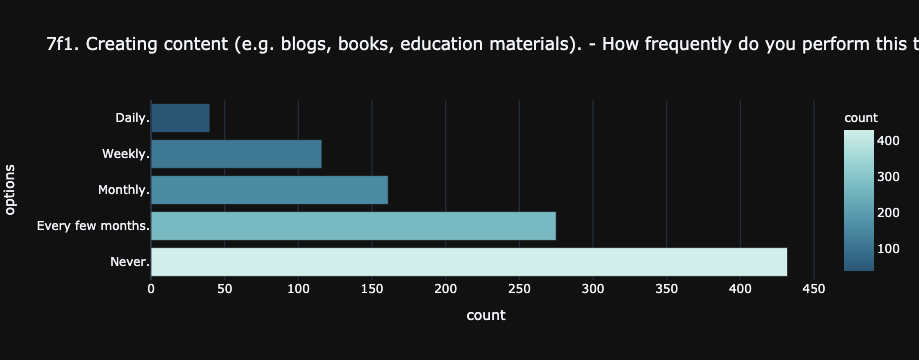

In [97]:
px.bar(q7f1, x='count', y='options', title=q7f1_name, height=300, **counts_color_kwargs)

In [98]:
q7f2_name = '7f2. Creating content (e.g. blogs, books, education materials). - Has Jupyter met your expectations for this use case?'

In [99]:
q7f2 = series_counts_to_frame(main_df=df, col_name=q7f2_name)
q7f2 = q7f2.reindex([1,3,2,0])

In [100]:
q7f3_name = '7f3. Creating content (e.g. blogs, books, education materials). - Have\xa0alternative tools met your expectations for this use case?'

In [101]:
q7f3 = series_counts_to_frame(main_df=df, col_name=q7f3_name)
q7f3 = q7f3.reindex([0,3,2,1])

In [102]:
q7f_name = '7f. Creating content (e.g. blogs, books, education materials). Meets expectations.'

In [103]:
q7f_merged = merge_expectations(q7f2, q7f3)

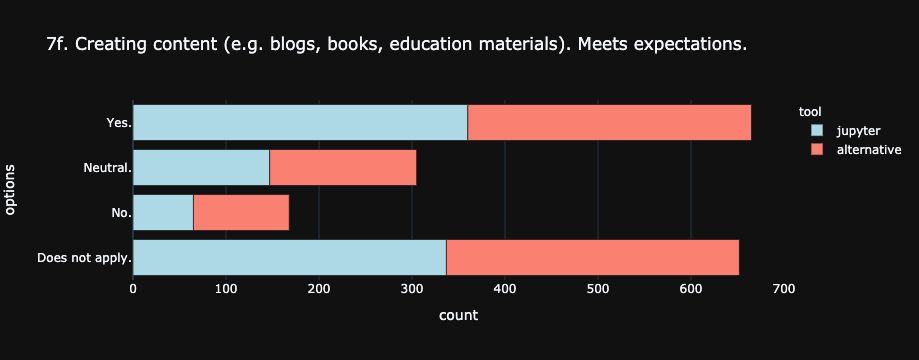

In [104]:
px.bar(q7f_merged, x='count', y='options', title=q7f_name, **compare_color_kwargs)

---

In [105]:
q7g1_name = '7g1. Documenting research (e.g. reports, scientific papers). - How frequently do you\xa0perform this task?'

In [106]:
q7g1 = series_counts_to_frame(main_df=df, col_name=q7g1_name)
q7g1 = q7g1.reindex([2, 0, 3, 1, 4])

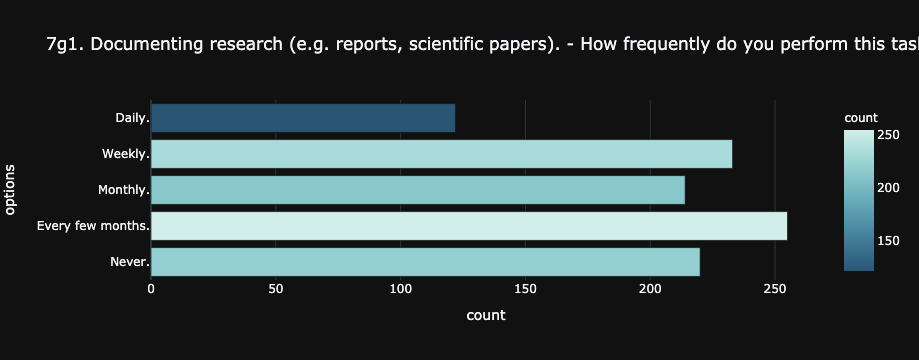

In [107]:
px.bar(q7g1, x='count', y='options', title=q7g1_name, height=300, **counts_color_kwargs)

In [108]:
q7g2_name = '7g2. Documenting research (e.g. reports, scientific papers). - Has Jupyter met your expectations for this use case?'

In [109]:
q7g2 = series_counts_to_frame(main_df=df, col_name=q7g2_name)
q7g2 = q7g2.reindex([1,3,2,0])

In [110]:
q7g3_name = '7g3. Documenting research (e.g. reports, scientific papers). - Have\xa0alternative tools met your expectations for this use case?'

In [111]:
q7g3 = series_counts_to_frame(main_df=df, col_name=q7g3_name)
q7g3 = q7g3.reindex([2, 3, 1, 0])

In [112]:
q7g_name = '7g.  Documenting research (e.g. reports, scientific papers). Meets expectations.'

In [113]:
q7g_merged = merge_expectations(q7g2, q7g3)

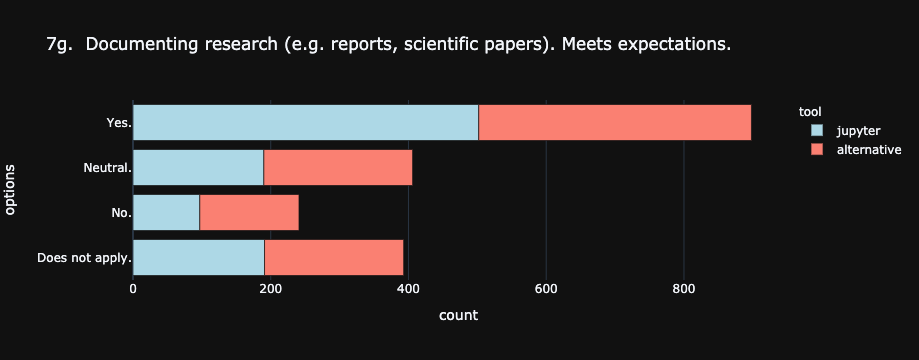

In [114]:
px.bar(q7g_merged, x='count', y='options', title=q7g_name, **compare_color_kwargs)

---

In [115]:
q7h1_name = '7h1. Run pipelines, workflows, or ETL (extract, transform, load) jobs. - How frequently do you\xa0perform this task?'

In [116]:
q7h1 = series_counts_to_frame(main_df=df, col_name=q7h1_name)
q7h1 = q7h1.reindex([0, 2, 3, 1, 4])

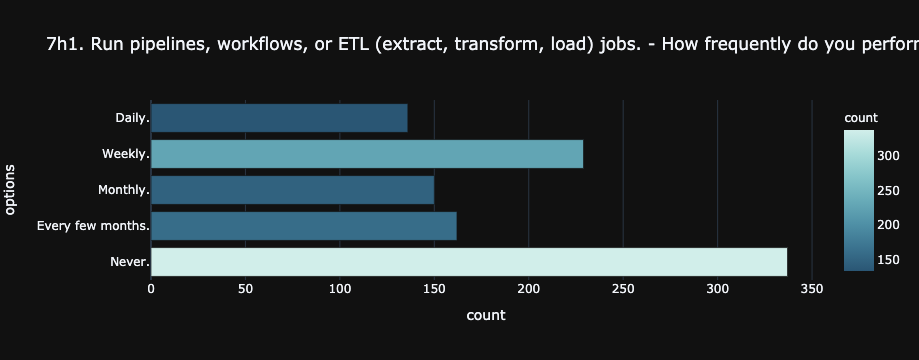

In [117]:
px.bar(q7h1, x='count', y='options', title=q7h1_name, height=300, **counts_color_kwargs)

In [118]:
q7h2_name = '7h2. Run pipelines, workflows, or ETL (extract, transform, load) jobs. - Has Jupyter met your expectations for this use case?'

In [119]:
q7h2 = series_counts_to_frame(main_df=df, col_name=q7h2_name)
q7h2 = q7h2.reindex([0, 3, 2, 1])

In [120]:
q7h3_name = '7h3. Run pipelines, workflows, or ETL (extract, transform, load) jobs. - Have\xa0alternative tools met your expectations for this use case?'

In [121]:
q7h3 = series_counts_to_frame(main_df=df, col_name=q7h3_name)
q7h3 = q7h3.reindex([1,3,2,0])

In [122]:
q7h_name = '7h.  Run pipelines, workflows, or ETL (extract, transform, load) jobs. Meets expectations.'

In [123]:
q7h_merged = merge_expectations(q7h2, q7h3)

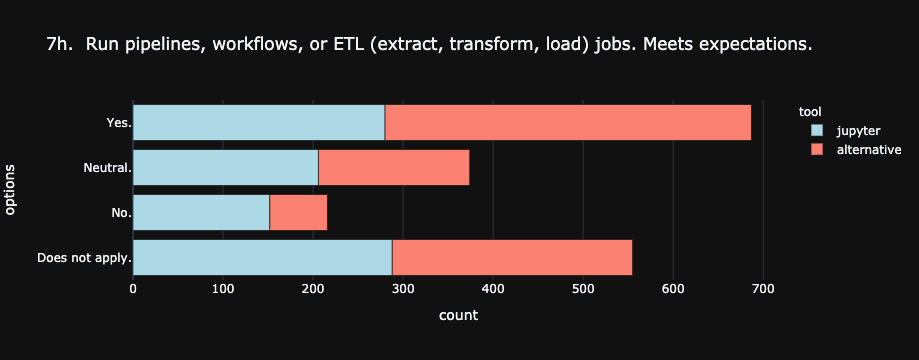

In [124]:
px.bar(q7h_merged, x='count', y='options', title=q7h_name, **compare_color_kwargs)

---

In [125]:
q7i1_name = '7i1. Writing software documentation. - How frequently do you\xa0perform this task?'

In [126]:
q7i1 = series_counts_to_frame(main_df=df, col_name=q7i1_name)

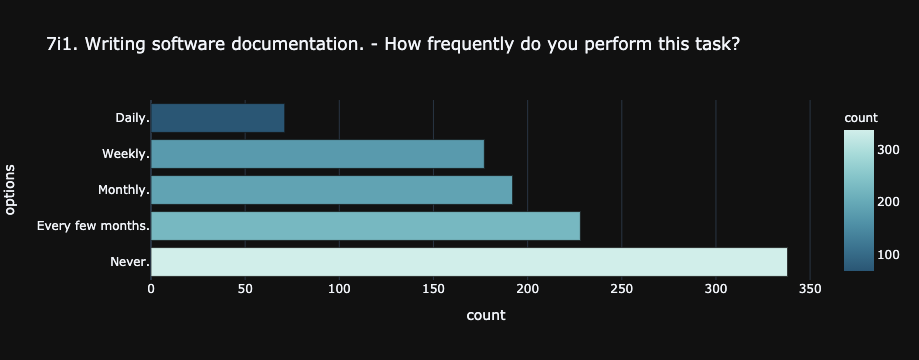

In [127]:
px.bar(q7i1, x='count', y='options', title=q7i1_name, height=300, **counts_color_kwargs)

In [128]:
q7i2_name = '7i2. Writing software documentation. - Has Jupyter met your expectations for this use case?'

In [129]:
q7i2 = series_counts_to_frame(main_df=df, col_name=q7i2_name)
q7i2 = q7i2.reindex([0, 2,3,1])

In [130]:
q7i3_name = '7i3. Writing software documentation. - Have\xa0alternative tools met your expectations for this use case?'

In [131]:
q7i3 = series_counts_to_frame(main_df=df, col_name=q7i3_name)
q7i3 = q7i3.reindex([1, 3, 2, 0])

In [132]:
q7i_name = '7i. Writing software documentation. Meets expectations.'

In [133]:
q7i_merged = merge_expectations(q7i2, q7i3)

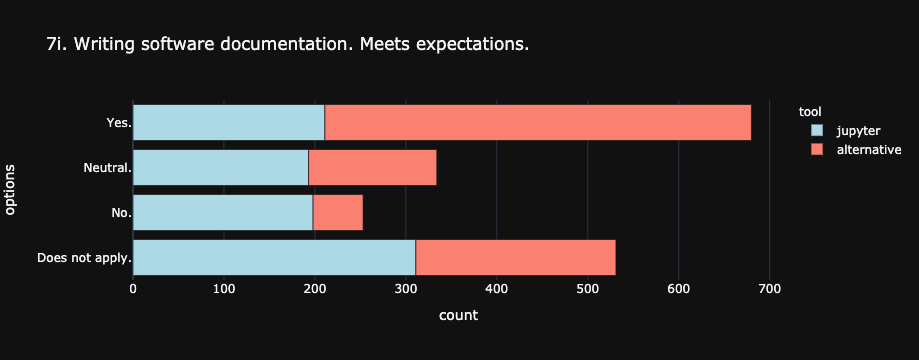

In [134]:
px.bar(q7i_merged, x='count', y='options', title=q7i_name, **compare_color_kwargs)

---

In [135]:
q7j1_name = '7j1. Finding extensions/ plugins to solve my problems. - How frequently do you\xa0perform this task?'

In [136]:
q7j1 = series_counts_to_frame(main_df=df, col_name=q7j1_name)
q7j1 = q7j1.reindex([1,0,2,3,4])

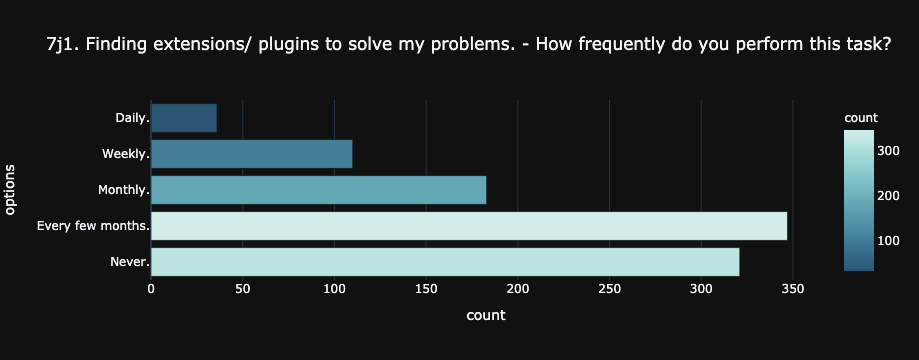

In [137]:
px.bar(q7j1, x='count', y='options', title=q7j1_name, height=300, **counts_color_kwargs)

In [138]:
q7j2_name = '7j2. Finding extensions/ plugins to solve my problems. - Has Jupyter met your expectations for this use case?'

In [139]:
q7j2 = series_counts_to_frame(main_df=df, col_name=q7j2_name)
q7j2 = q7j2.reindex([0, 3, 1, 2])

In [140]:
q7j3_name = '7j3. Finding extensions/ plugins to solve my problems. - Have\xa0alternative tools met your expectations for this use case?'

In [141]:
q7j3 = series_counts_to_frame(main_df=df, col_name=q7j3_name)
q7j3 = q7j3.reindex([0, 3,2,1])

In [142]:
q7j_name = '7j. Finding extensions/ plugins to solve my problems. Meets expectations.'

In [143]:
q7j_merged = merge_expectations(q7j2, q7j3)

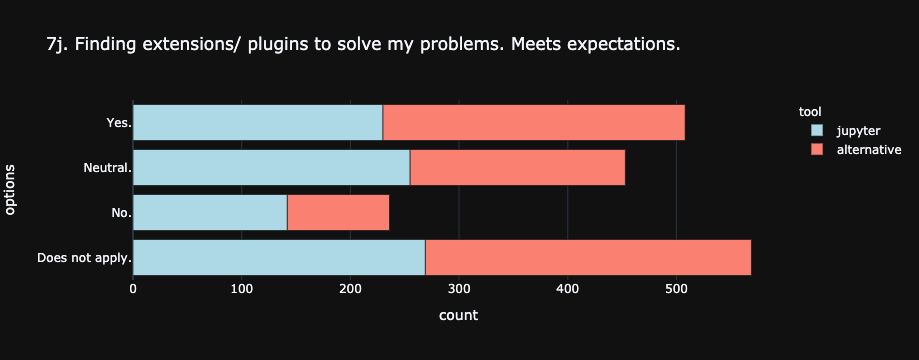

In [144]:
px.bar(q7j_merged, x='count', y='options', title=q7j_name, **compare_color_kwargs)

---

In [145]:
q7k1_name ='7k1. Developing extensions/ plugins to solve my problems. - How frequently do you\xa0perform this task?'

In [146]:
q7k1 = series_counts_to_frame(main_df=df, col_name=q7k1_name)

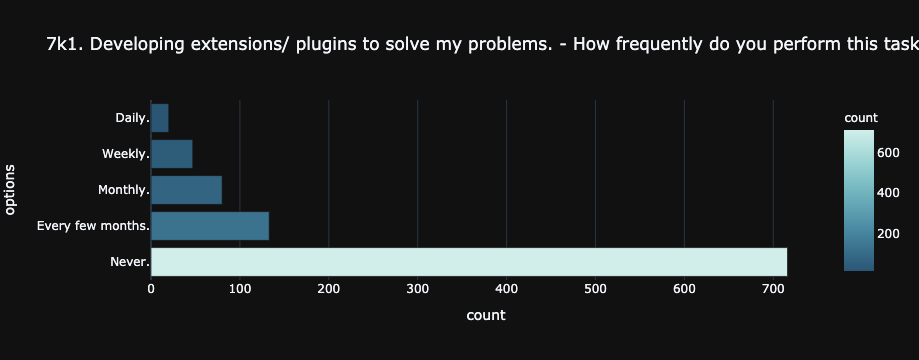

In [147]:
px.bar(q7k1, x='count', y='options', title=q7k1_name, height=300, **counts_color_kwargs)

In [148]:
q7k2_name ='7k2. Developing extensions/ plugins to solve my problems. - Has Jupyter met your expectations for this use case?'

In [149]:
q7k2 = series_counts_to_frame(main_df=df, col_name=q7k2_name)
q7k2 = q7k2.reindex([0,3,1,2])

In [150]:
q7k3_name = '7k3. Developing extensions/ plugins to solve my problems. - Have\xa0alternative tools met your expectations for this use case?'

In [151]:
q7k3 = series_counts_to_frame(main_df=df, col_name=q7k3_name)
q7k3 = q7k3.reindex([0, 3,2,1])

In [152]:
q7k_name = '7k. Developing extensions/ plugins to solve my problems. Meets expectations.'

In [153]:
q7k_merged = merge_expectations(q7k2, q7k3)

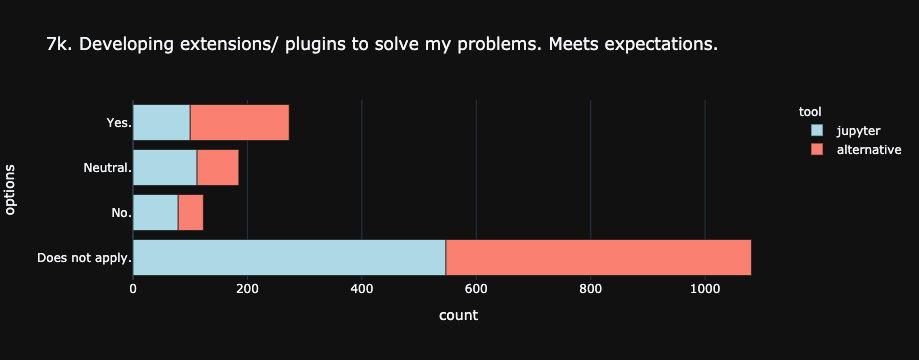

In [154]:
px.bar(q7k_merged, x='count', y='options', title=q7k_name, **compare_color_kwargs)

---

In [155]:
q8_name = "8. What data sources are you primarily working with in your role? (pick up to 3)"

In [156]:
cols_8 = [col for col in df.columns.tolist() if col.startswith('8.')]

In [157]:
counts_8_records = []

In [158]:
for col in cols_8:
    count = df[col].count()
    col = col.split("8. ", 1).pop()
    record = {"datastore":col, "count":count}
    counts_8_records.append(record)

In [159]:
counts_8_df = pd.DataFrame.from_records(counts_8_records).sort_values('count')

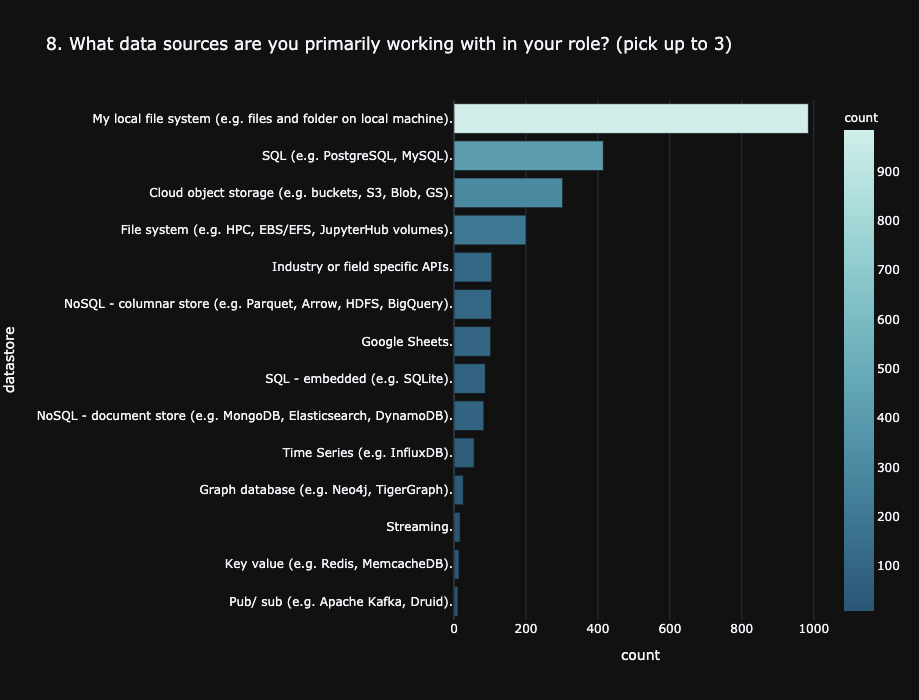

In [160]:
px.bar(counts_8_df, x='count', y='datastore', title=q8_name, height=700, **counts_color_kwargs)

---

In [161]:
q9_name = '9. What data formats are you mostly working with? (pick up to 3)'

In [162]:
cols_9 = [col for col in df.columns.tolist() if col.startswith('9.')]

In [163]:
counts_9_records = []

In [164]:
for col in cols_9:
    count = df[col].count()
    col = col.split("9. ", 1).pop()
    record = {"data_format":col, "count":count}
    counts_9_records.append(record)

In [165]:
counts_9_df = pd.DataFrame.from_records(counts_9_records).sort_values('count')

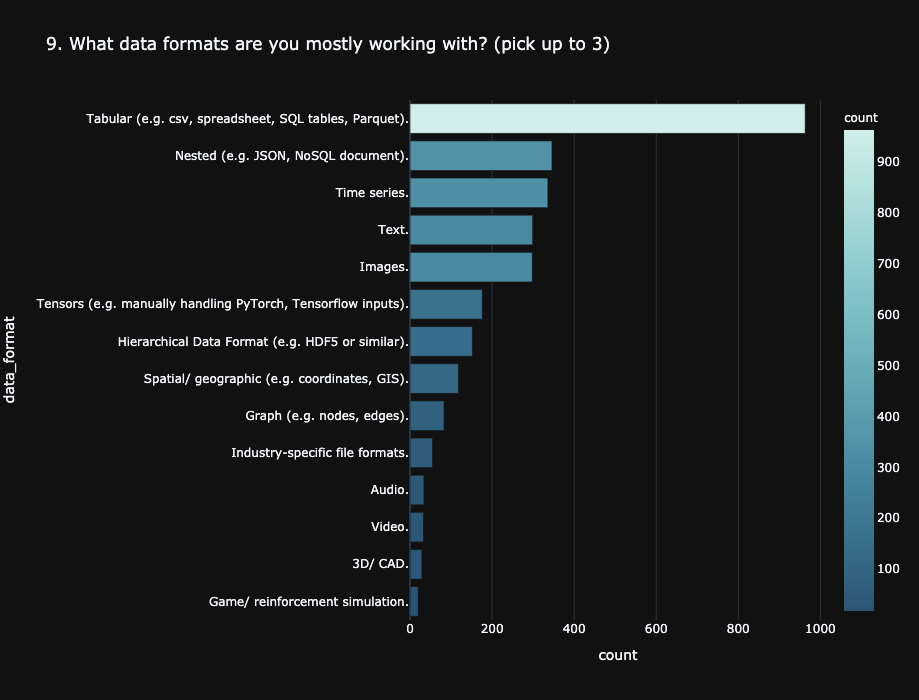

In [166]:
px.bar(counts_9_df, x='count', y='data_format', title=q9_name, height=700, **counts_color_kwargs)

---

In [167]:
q10a_name = '10a. Data is too big to fit into memory on my machine/ server.'

In [168]:
q10a = series_counts_to_frame(main_df=df, col_name=q10a_name)
q10a = q10a.reindex([5, 0, 4, 1, 2, 3])

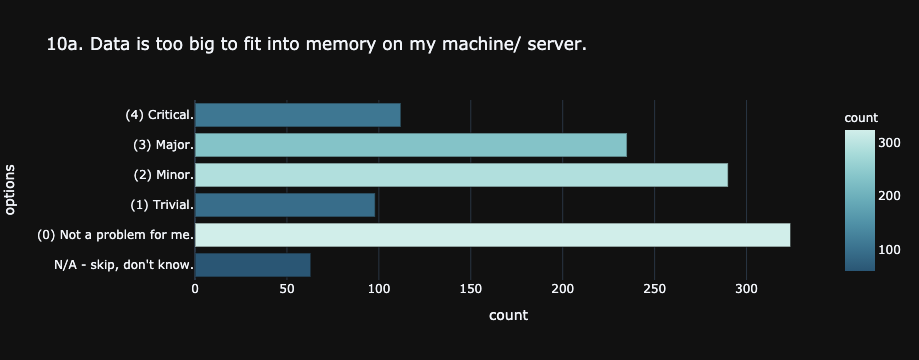

In [169]:
px.bar(q10a, x='count', y='options', title=q10a_name, height=350, **counts_color_kwargs)

In [170]:
q10b_name = '10b. Lost data\xa0during failure or restart of kernel/ server.'

In [171]:
q10b = series_counts_to_frame(main_df=df, col_name=q10b_name)
q10b = q10a.reindex([5, 0, 4, 1, 2, 3])

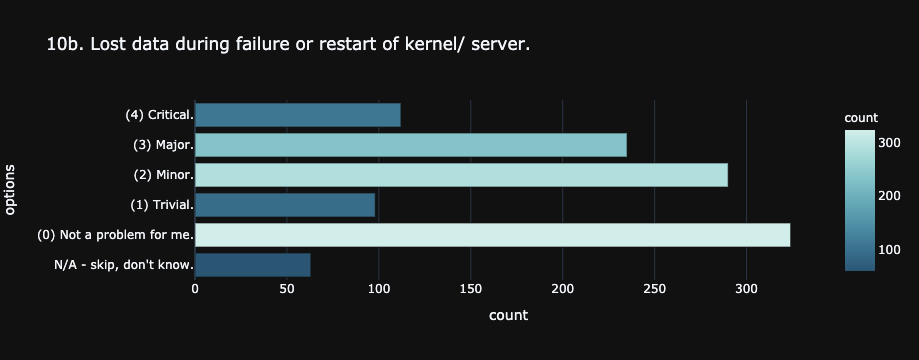

In [172]:
px.bar(q10b, x='count', y='options', title=q10b_name, height=350, **counts_color_kwargs)

In [173]:
q10c_name = '10c. Can’t see a list of my current variables.'

In [174]:
q10c = series_counts_to_frame(main_df=df, col_name=q10c_name)
q10c = q10c.reindex([5, 0, 3, 1, 2, 4])

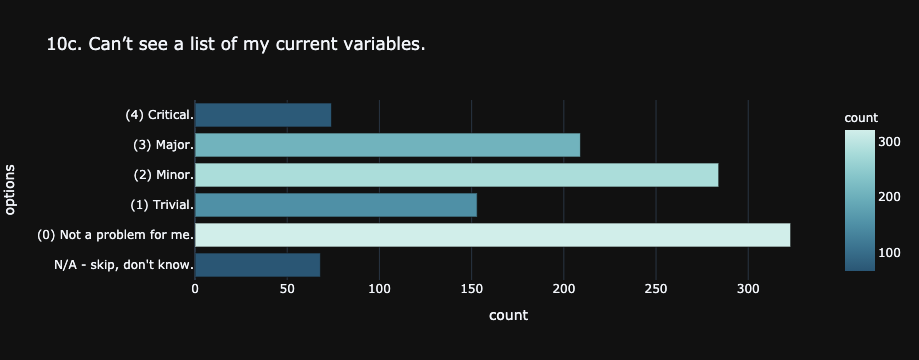

In [175]:
px.bar(q10c, x='count', y='options', title=q10c_name, height=350, **counts_color_kwargs)

In [176]:
q10d_name = '10d. No grid\xa0view for\xa0manipulating/ filtering\xa0dataframes and arrays.'

In [177]:
q10d = series_counts_to_frame(main_df=df, col_name=q10d_name)
q10d = q10d.reindex([4, 0, 3, 1, 2, 5])

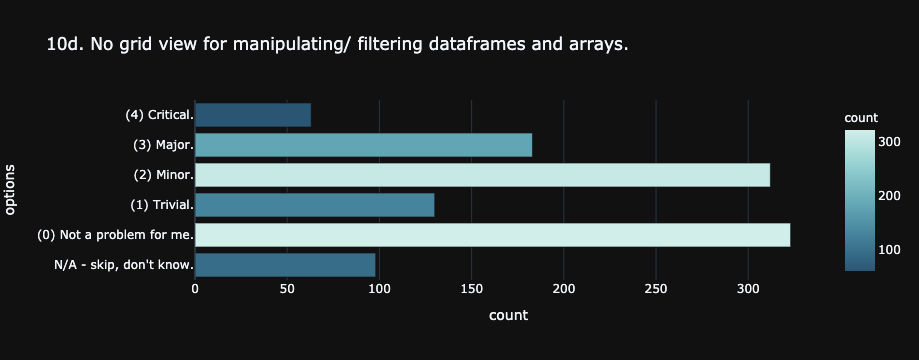

In [178]:
px.bar(q10d, x='count', y='options', title=q10d_name, height=350, **counts_color_kwargs)

In [179]:
q10e_name = '10e. Poor\xa0MVC/ ORM integrations (e.g. Django, Flask).'

In [180]:
q10e = series_counts_to_frame(main_df=df, col_name=q10e_name)
q10e = q10e.reindex([1, 0, 3, 2, 4, 5])

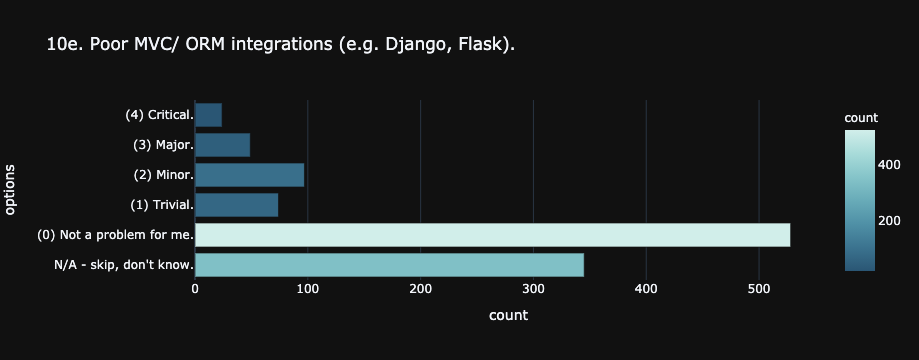

In [181]:
px.bar(q10e, x='count', y='options', title=q10e_name, height=350, **counts_color_kwargs)

In [182]:
q10f_name = '10f. Plaintext\xa0or environment variable management\xa0of database passwords/ keys/ secrets.'

In [183]:
q10f = series_counts_to_frame(main_df=df, col_name=q10f_name)
q10f = q10f.reindex([2, 0, 3, 1, 4, 5])

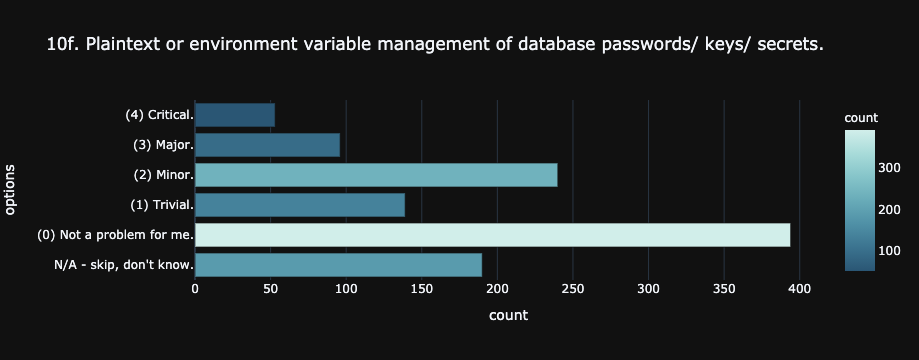

In [184]:
px.bar(q10f, x='count', y='options', title=q10f_name, height=350, **counts_color_kwargs)

---

In [185]:
q11_name = '11. What type of analysis are you running? (pick up to 4)'

In [186]:
cols_11 = [col for col in df.columns.tolist() if col.startswith('11.')]

In [187]:
counts_11_records = []

In [188]:
for col in cols_11:
    count = df[col].count()
    col = col.split("11. ", 1).pop()
    record = {"analysis":col, "count":count}
    counts_11_records.append(record)

In [189]:
counts_11_df = pd.DataFrame.from_records(counts_11_records).sort_values('count')

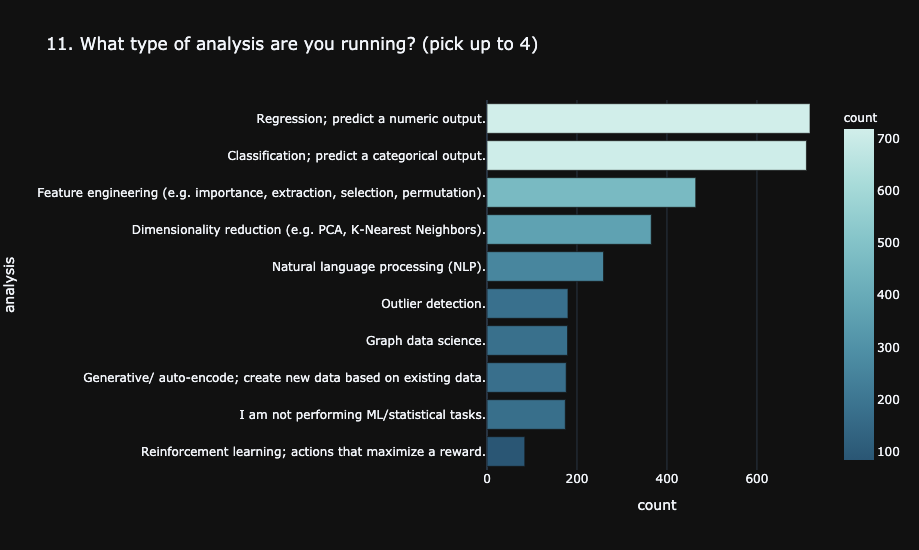

In [190]:
px.bar(counts_11_df, x='count', y='analysis', title=q11_name, height=550, **counts_color_kwargs)

---

In [191]:
q12_name = '12. What tools do you use to create dashboards? (pick up to 3)'

In [192]:
cols_12 = [col for col in df.columns.tolist() if col.startswith('12.')]

In [193]:
counts_12_records = []

In [194]:
for col in cols_12:
    count = df[col].count()
    col = col.split("12. ", 1).pop()
    record = {"dashboard":col, "count":count}
    counts_12_records.append(record)

In [195]:
counts_12_df = pd.DataFrame.from_records(counts_12_records).sort_values('count')

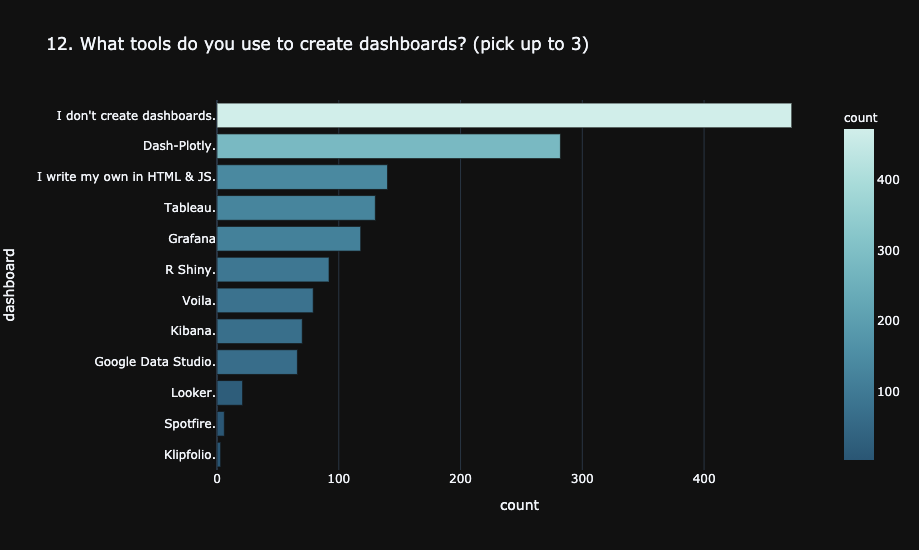

In [196]:
px.bar(counts_12_df, x='count', y='dashboard', title=q12_name, height=550, **counts_color_kwargs)

---

In [197]:
q13a_name = '13a. No built-in UI for creating charts.'

In [198]:
q13a = series_counts_to_frame(main_df=df, col_name=q13a_name)
q13a = q10e.reindex([3, 0, 2, 1, 4, 5])

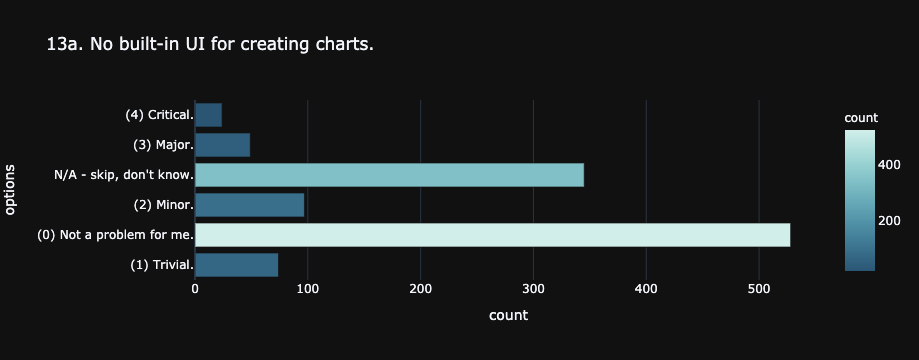

In [199]:
px.bar(q13a, x='count', y='options', title=q13a_name, height=350, **counts_color_kwargs)

In [200]:
q13b_name = "13b. Can't publish my charts as web-based dashboards."

In [201]:
q13b = series_counts_to_frame(main_df=df, col_name=q13b_name)
q13b = q13b.reindex([3, 0, 4, 1, 2, 5])
q13b

,count,options
3,169,"N/A - skip, don't know."
0,402,(0) Not a problem for me.
4,87,(1) Trivial.
1,222,(2) Minor.
2,174,(3) Major.
5,69,(4) Critical.


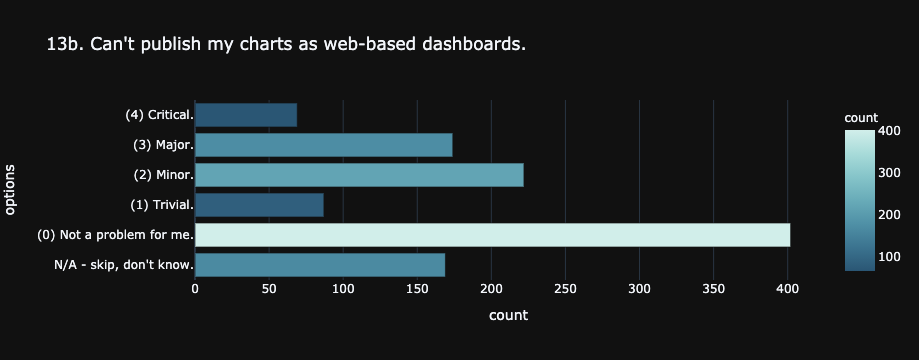

In [202]:
px.bar(q13b, x='count', y='options', title=q13b_name, height=350, **counts_color_kwargs)

In [203]:
q13c_name = '13c. Poor/ buggy support for my plotting tool.'

In [204]:
q13c = series_counts_to_frame(main_df=df, col_name=q13c_name)
q13c = q13c.reindex([1, 0, 3, 2, 4, 5])

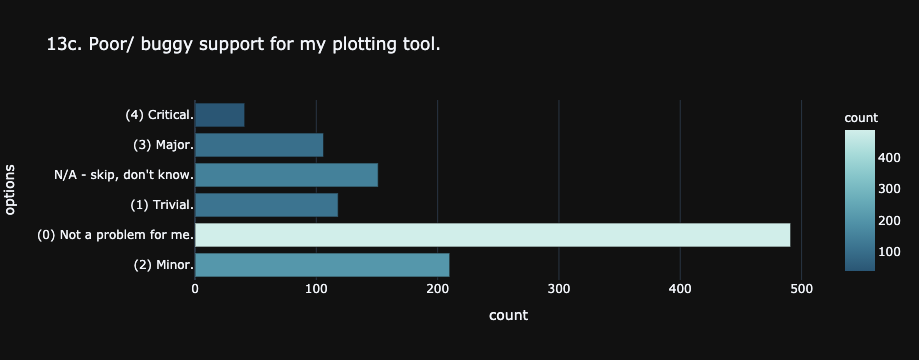

In [205]:
px.bar(q13c, x='count', y='options', title=q13c_name, height=350, **counts_color_kwargs)

In [206]:
q13d_name = '13d. Difficulty displaying\xa0highly dimensional data (e.g. array of array of arrays, too many rows/ columns to fit on screen).'

In [207]:
q13d = series_counts_to_frame(main_df=df, col_name=q13d_name)
q13d = q13d.reindex([3, 1, 4, 0, 2, 5])

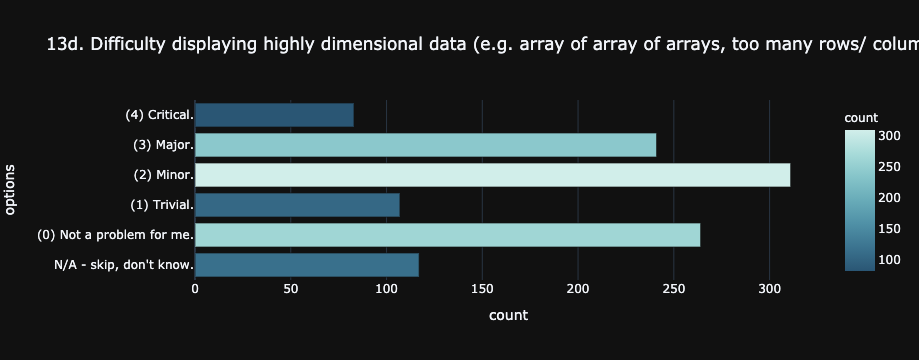

In [208]:
px.bar(q13d, x='count', y='options', title=q13d_name, height=350, **counts_color_kwargs)

In [209]:
q13e_name = '13e. Lacking\xa0templating support (e.g. Jinja2).'

In [210]:
q13e = series_counts_to_frame(main_df=df, col_name=q13e_name)
q13e = q13e.reindex([1,0,3,2,4,5])

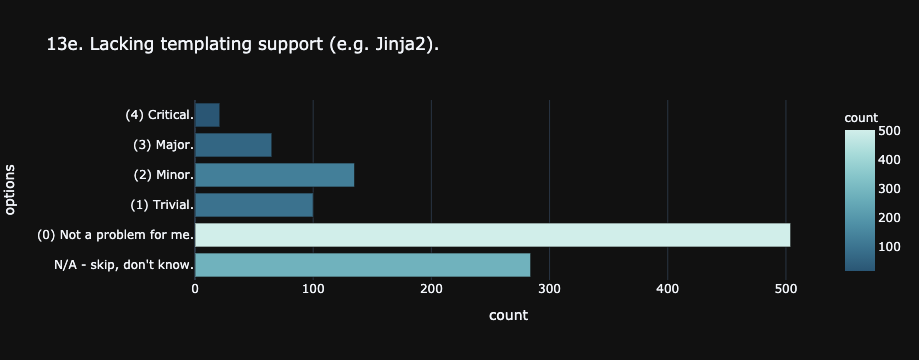

In [211]:
px.bar(q13e, x='count', y='options', title=q13e_name, height=350, **counts_color_kwargs)

---

In [212]:
q14_name = '14. How do you scale and schedule your workloads? (pick up to 4)'

In [213]:
cols_14 = [col for col in df.columns.tolist() if col.startswith('14.')]

In [214]:
counts_14_records = []

In [215]:
for col in cols_14:
    count = df[col].count()
    col = col.split("14. ", 1).pop()
    record = {"env":col, "count":count}
    counts_14_records.append(record)

In [216]:
counts_14_df = pd.DataFrame.from_records(counts_14_records).sort_values('count')

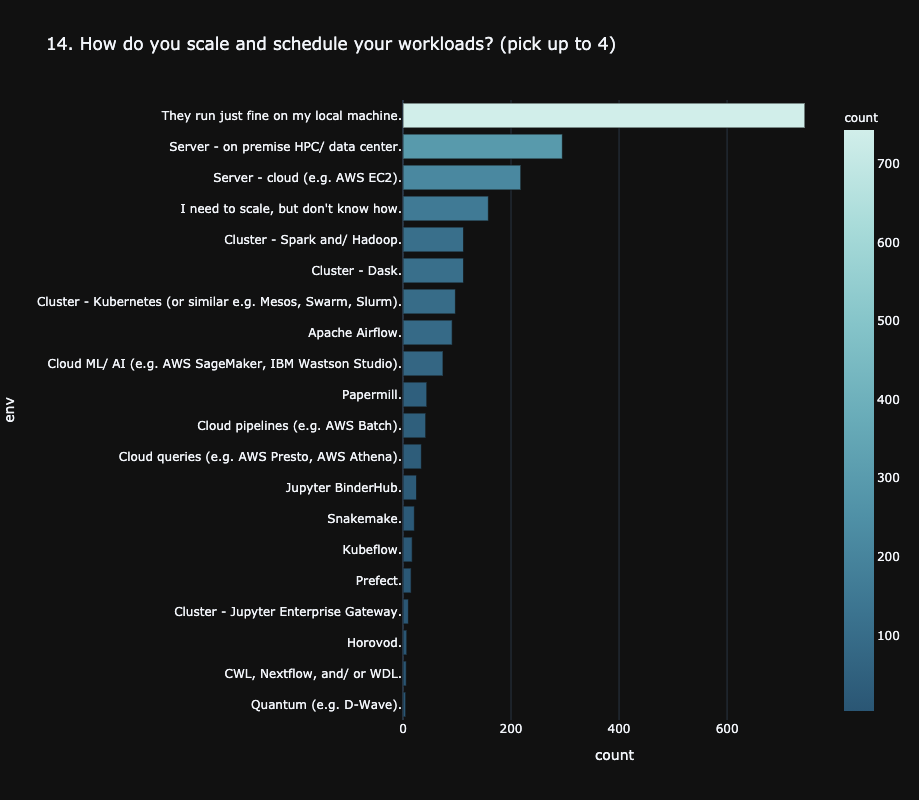

In [217]:
px.bar(counts_14_df, x='count', y='env', title=q14_name, height=800, **counts_color_kwargs)

---

In [218]:
q15a_name = '15a. Figuring out how to schedule batch execution of notebook-based jobs.'

In [219]:
q15a = series_counts_to_frame(main_df=df, col_name=q15a_name)
q15a = q15a.reindex([1, 0, 4, 2, 3, 5])

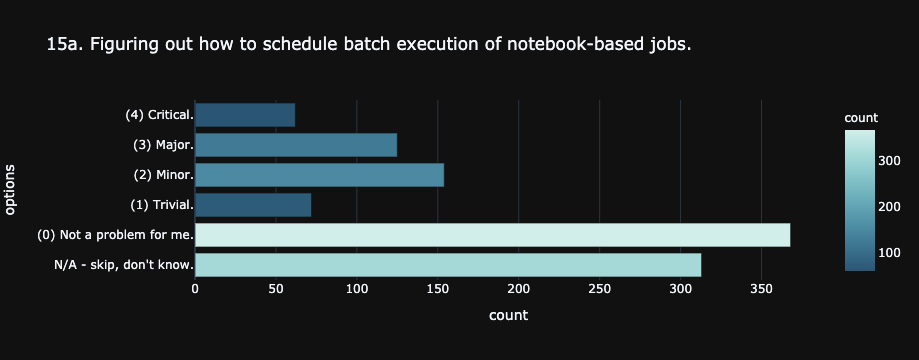

In [220]:
px.bar(q15a, x='count', y='options', title=q15a_name, height=350, **counts_color_kwargs)

In [221]:
q15b_name = '15b. Don’t have the budget for more scalable environment/ cloud services.'

In [222]:
q15b = series_counts_to_frame(main_df=df, col_name=q15b_name)
q15b = q15b.reindex([1, 0, 4, 2, 3, 5])

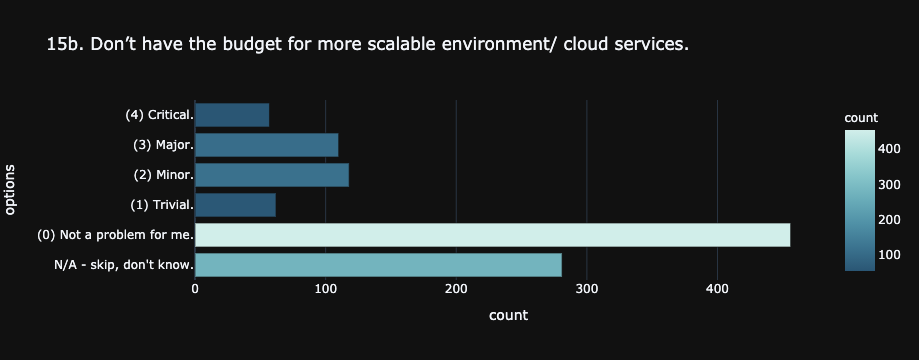

In [223]:
px.bar(q15b, x='count', y='options', title=q15b_name, height=350, **counts_color_kwargs)

In [224]:
q15c_name = '15c. Haven’t divided longer notebooks into multiple, modular notebooks.'

In [225]:
q15c = series_counts_to_frame(main_df=df, col_name=q15c_name)
q15c = q15c.reindex([1, 0, 4, 2, 3, 5])

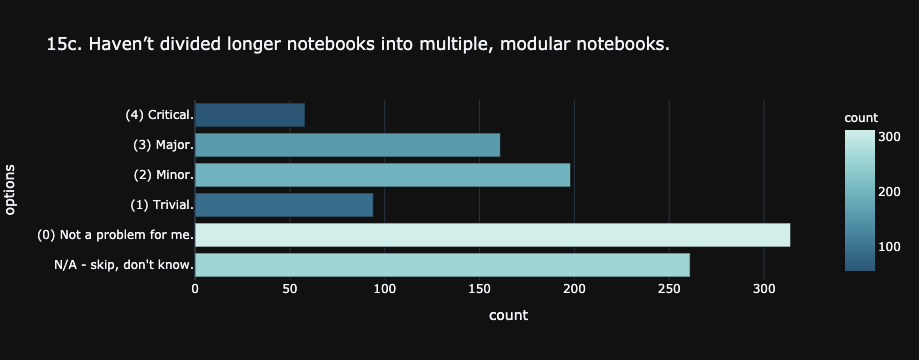

In [226]:
px.bar(q15c, x='count', y='options', title=q15c_name, height=350, **counts_color_kwargs)

In [227]:
q15d_name = '15d. Not persisting the outputs of a notebook.'

In [228]:
q15d = series_counts_to_frame(main_df=df, col_name=q15d_name)
q15d = q15d.reindex([1, 0, 4, 2, 3, 5])

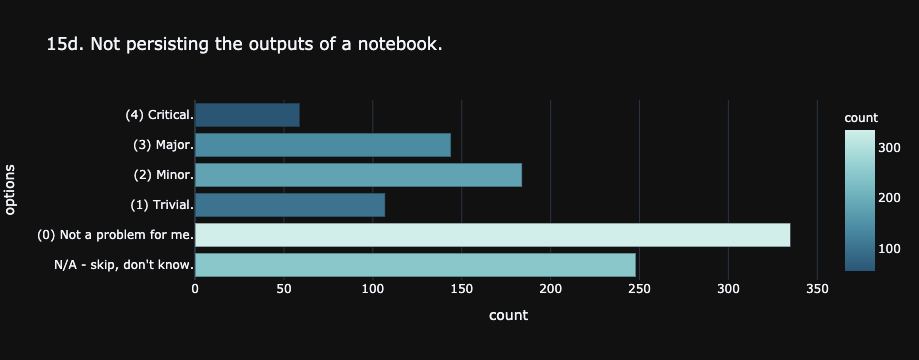

In [229]:
px.bar(q15d, x='count', y='options', title=q15d_name, height=350, **counts_color_kwargs)

In [230]:
q15e_name = '15e. Machine learning training jobs take too long.'

In [231]:
q15e = series_counts_to_frame(main_df=df, col_name=q15e_name)
q15e = q15e.reindex([1, 0, 4, 2, 3, 5])

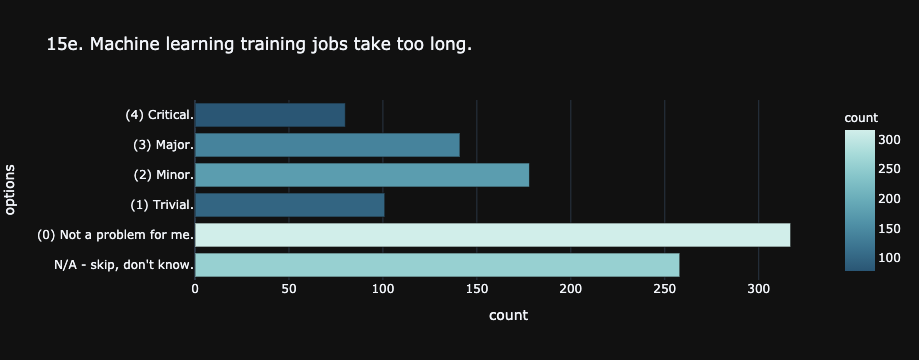

In [232]:
px.bar(q15e, x='count', y='options', title=q15e_name, height=350, **counts_color_kwargs)

In [233]:
q15f_name = "15f. Can't call code/ modules from other notebooks."

In [234]:
q15f = series_counts_to_frame(main_df=df, col_name=q15f_name)
q15f = q15f.reindex([1, 0, 4, 2, 3, 5])

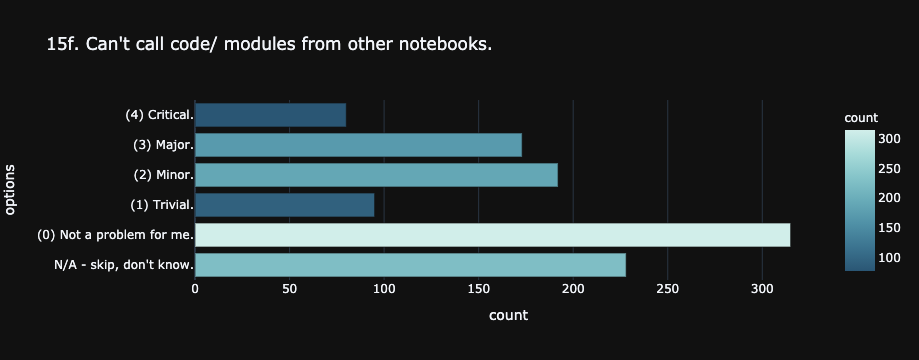

In [235]:
px.bar(q15f, x='count', y='options', title=q15f_name, height=350, **counts_color_kwargs)

In [236]:
q15g_name = '15g. Difficulty managing\xa0Spark dependencies (Java).'

In [237]:
q15g = series_counts_to_frame(main_df=df, col_name=q15g_name)
q15g = q15g.reindex([0, 1, 3, 2, 4, 5])

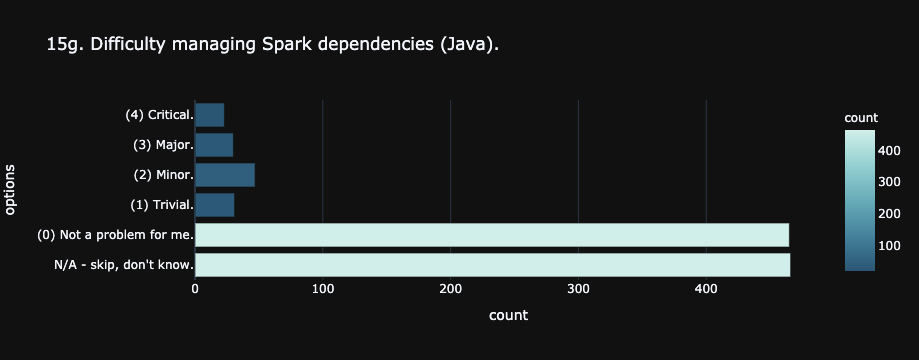

In [238]:
px.bar(q15g, x='count', y='options', title=q15g_name, height=350, **counts_color_kwargs)

---

In [239]:
q17_name = '17. What is your reason for sharing a notebook with someone else? (pick up to 3)'

In [240]:
cols_17 = [col for col in df.columns.tolist() if col.startswith('17.')]

In [241]:
counts_17_records = []

In [242]:
for col in cols_17:
    count = df[col].count()
    col = col.split("17. ", 1).pop()
    record = {"reason":col, "count":count}
    counts_17_records.append(record)

In [243]:
counts_17_df = pd.DataFrame.from_records(counts_17_records).sort_values('count')

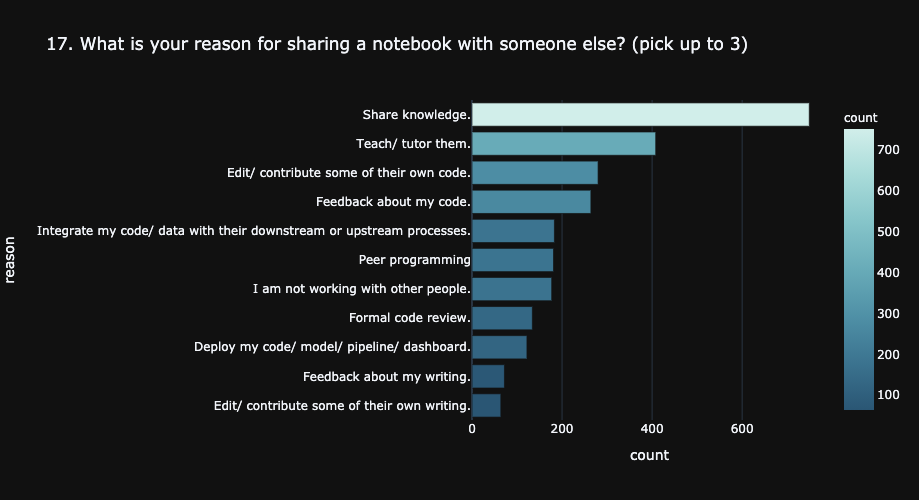

In [244]:
px.bar(counts_17_df, x='count', y='reason', title=q17_name, height=500, **counts_color_kwargs)

---

In [245]:
q18a_name = '18a. How long have you been working together?'

In [246]:
q18a = series_counts_to_frame(main_df=df, col_name=q18a_name)
q18a = q18a.reindex([1, 3, 4, 2, 0])   

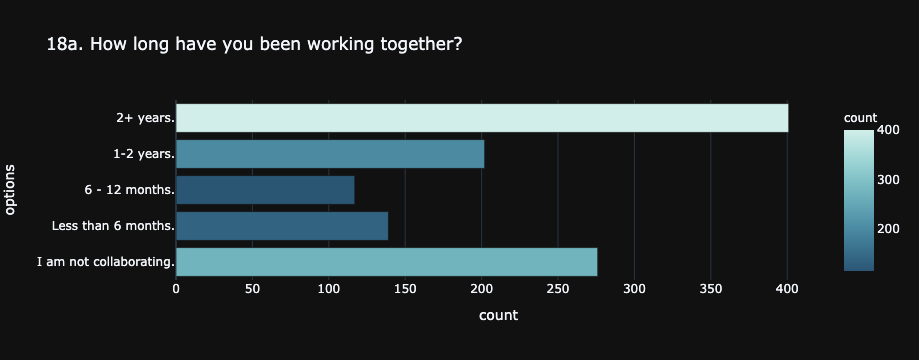

In [247]:
px.bar(q18a, x='count', y='options', title=q18a_name, height=350, **counts_color_kwargs)

In [248]:
q18b_name = '18b. How frequently do you work together?'

In [249]:
q18b = series_counts_to_frame(main_df=df, col_name=q18b_name)
q18b = q18b.reindex([1, 4, 5, 3, 0, 2])

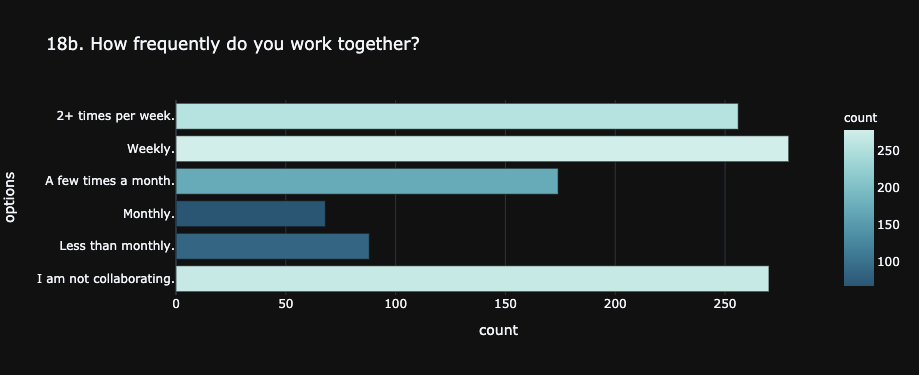

In [250]:
px.bar(q18b, x='count', y='options', title=q18b_name, height=375, **counts_color_kwargs)

In [251]:
q18c_name = '18c. How do you divide the work?'

In [252]:
q18c = series_counts_to_frame(main_df=df, col_name=q18c_name)
q18c = q18c.reindex([1, 2, 0, 3])

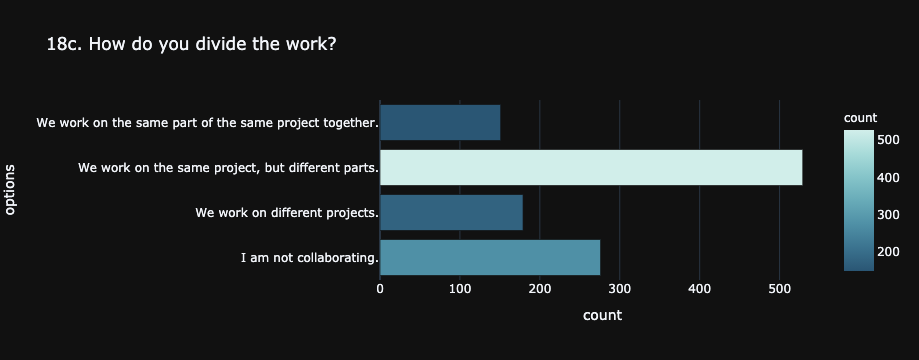

In [253]:
px.bar(q18c, x='count', y='options', title=q18c_name, height=250, **counts_color_kwargs)

---

In [254]:
q19a_name = "19a. Don't know what\xa0dependencies (versions of language, packages, extensions)\xa0a notebook uses."

In [255]:
q19a = series_counts_to_frame(main_df=df, col_name=q19a_name)
q19a = q19a.reindex([3,0,4,1,2,5])

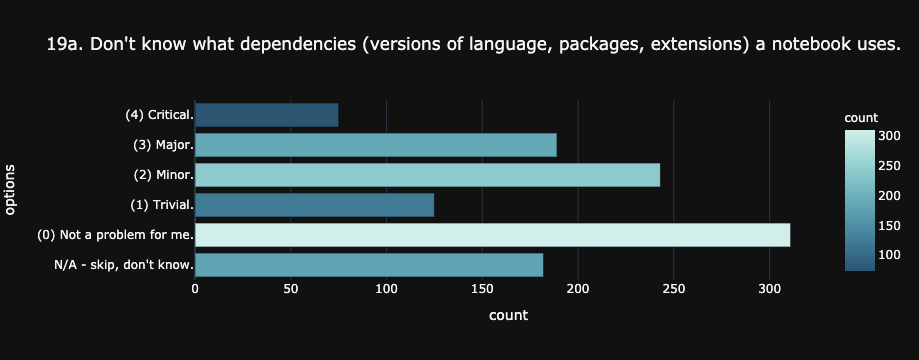

In [256]:
px.bar(q19a, x='count', y='options', title=q19a_name, height=350, **counts_color_kwargs)

In [257]:
q19b_name = "19b. Don't know/ have the data a notebook is supposed to use."

In [258]:
q19b = series_counts_to_frame(main_df=df, col_name=q19b_name)
q19b = q19b.reindex([2,0,3,1,4,5])

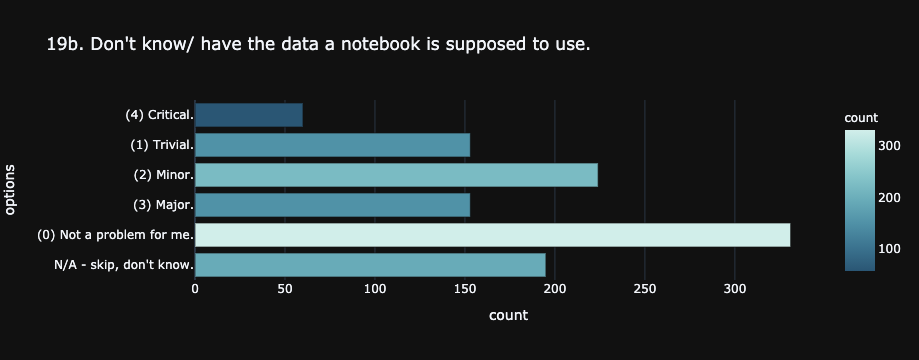

In [259]:
px.bar(q19b, x='count', y='options', title=q19b_name, height=350, **counts_color_kwargs)

In [260]:
q19c_name = '19c. Poor\xa0support for\xa0our version control (git) system.'

In [261]:
q19c = series_counts_to_frame(main_df=df, col_name=q19c_name)
q19c = q19c.reindex([3, 2, 5, 4, 1, 0])

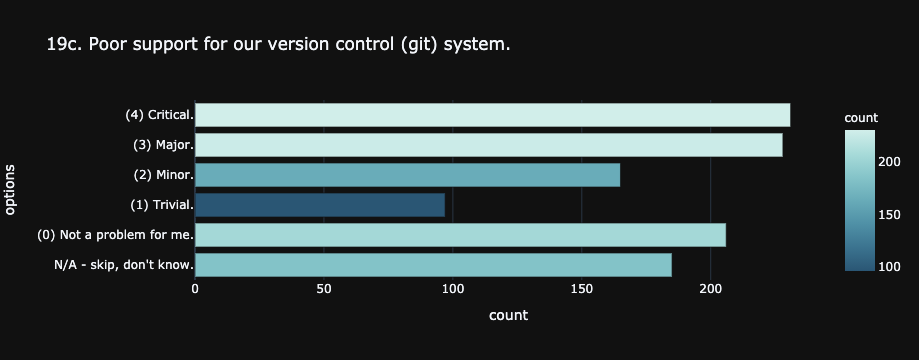

In [262]:
px.bar(q19c, x='count', y='options', title=q19c_name, height=350, **counts_color_kwargs)

In [263]:
q19d_name = '19d. No built-in\xa0way\xa0to publish my notebook to a shared location.'

In [264]:
q19d = series_counts_to_frame(main_df=df, col_name=q19d_name)
q19d = q19d.reindex([2, 0, 4, 1, 3, 5])

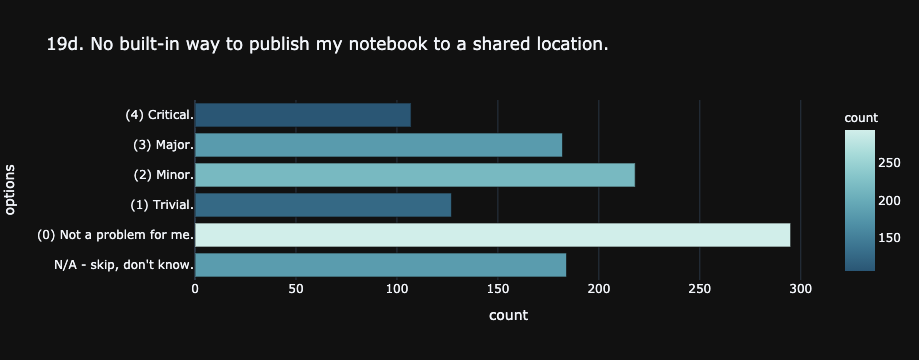

In [265]:
px.bar(q19d, x='count', y='options', title=q19d_name, height=350, **counts_color_kwargs)

In [266]:
q19e_name = '19e. Not being able to comment on notebooks.'

In [267]:
q19e = series_counts_to_frame(main_df=df, col_name=q19e_name)
q19e = q19e.reindex([3, 0, 4, 1, 2, 5])

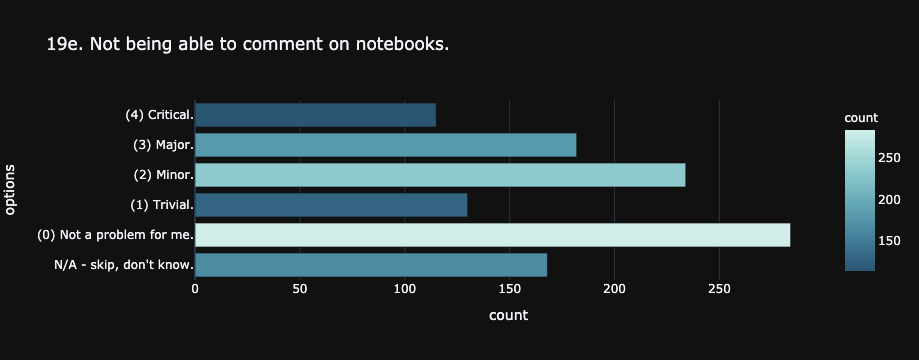

In [268]:
px.bar(q19e, x='count', y='options', title=q19e_name, height=350, **counts_color_kwargs)

In [269]:
q19f_name = '19f. No "track changes;" can\'t figure out what changed between notebook checkpoints/ versions.'

In [270]:
q19f = series_counts_to_frame(main_df=df, col_name=q19f_name)
q19f = q19f.reindex([4, 3, 5, 2, 0, 1])

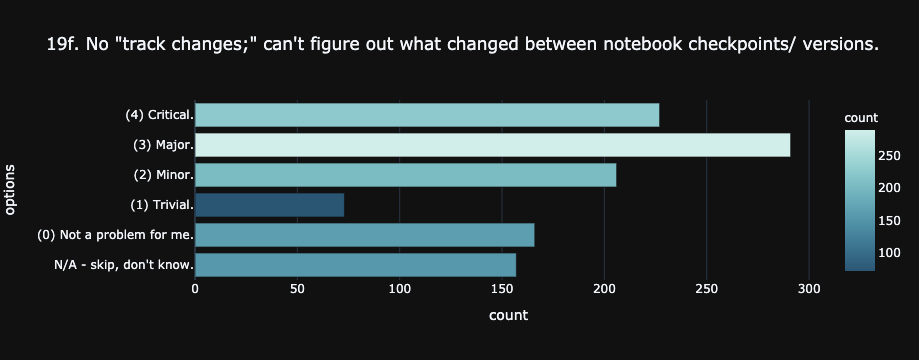

In [271]:
px.bar(q19f, x='count', y='options', title=q19f_name, height=350, **counts_color_kwargs)

---

In [272]:
q20a_name = '20a. Poor autocompletion (e.g. LSP, show methods/ attributes).'

In [273]:
q20a = series_counts_to_frame(main_df=df, col_name=q20a_name)
q20a = q20a.reindex([5, 2, 4, 0, 1, 3])

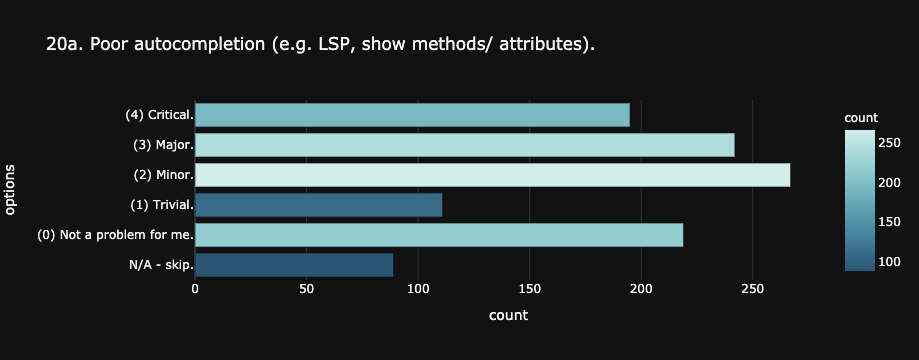

In [274]:
px.bar(q20a, x='count', y='options', title=q20a_name, height=350, **counts_color_kwargs)

In [275]:
q20b_name = '20b. No native desktop app.'

In [276]:
q20b = series_counts_to_frame(main_df=df, col_name=q20b_name)
q20b = q20b.reindex([4, 0, 1, 3, 2, 5])

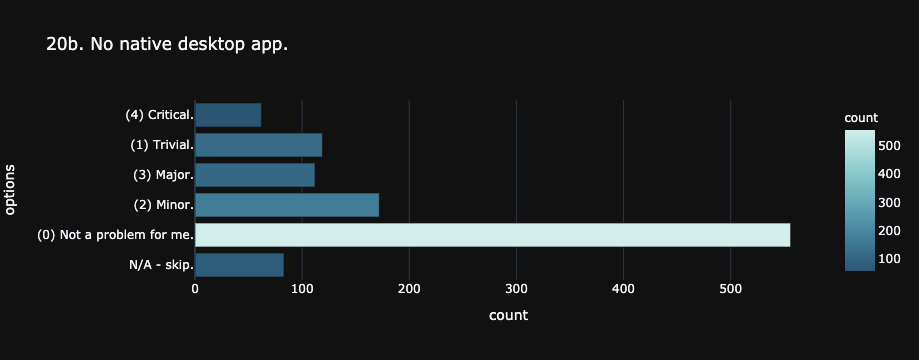

In [277]:
px.bar(q20b, x='count', y='options', title=q20b_name, height=350, **counts_color_kwargs)

In [278]:
q20c_name = "20c. Can't collapse sections of a notebook hierarchically."

In [279]:
q20c = series_counts_to_frame(main_df=df, col_name=q20c_name)
q20c = q20c.reindex([4, 1, 2, 0, 3, 5])

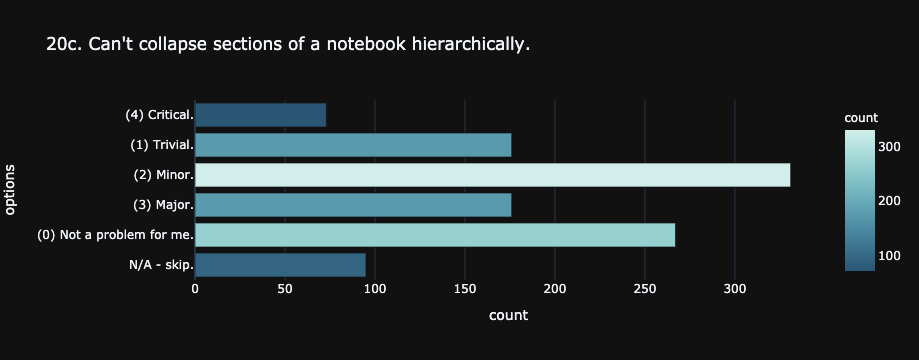

In [280]:
px.bar(q20c, x='count', y='options', title=q20c_name, height=350, **counts_color_kwargs)

In [281]:
q20d_name = "20d. Can't see hidden `.` files in file browser."

In [282]:
q20d = series_counts_to_frame(main_df=df, col_name=q20d_name)
q20d = q20d.reindex([3,0,2,1,4,5])

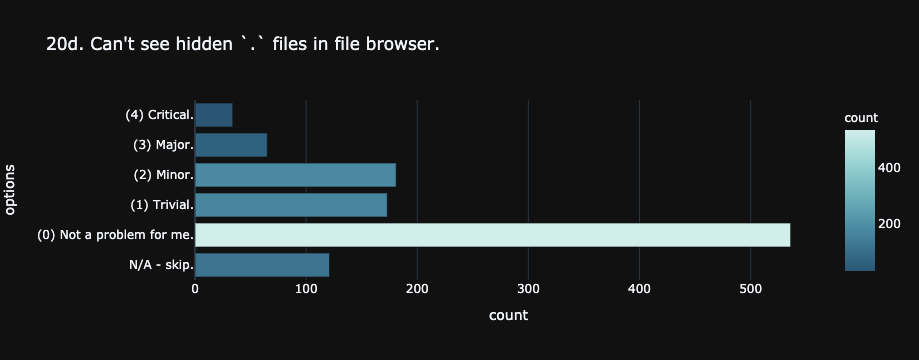

In [283]:
px.bar(q20d, x='count', y='options', title=q20d_name, height=350, **counts_color_kwargs)

In [284]:
q20e_name = "20e. Don't know which cell failed in long notebook."

In [285]:
q20e = series_counts_to_frame(main_df=df, col_name=q20e_name)
q20e = q20e.reindex([4,0,2,1,3,5])

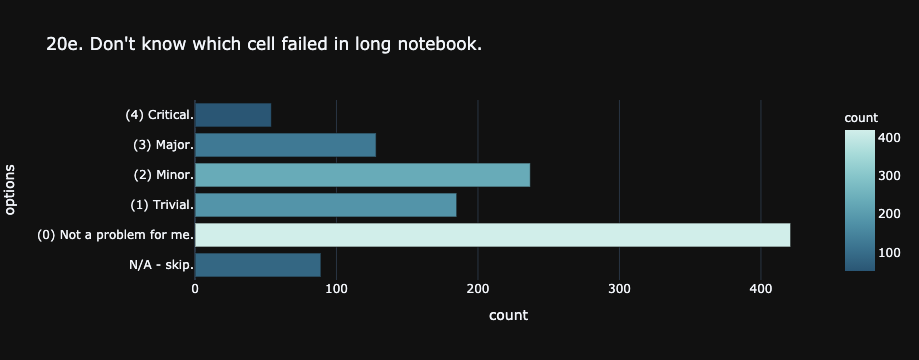

In [286]:
px.bar(q20e, x='count', y='options', title=q20e_name, height=350, **counts_color_kwargs)

In [287]:
q20f_name = "20f. No progress bar for running long notebooks."

In [288]:
q20f = series_counts_to_frame(main_df=df, col_name=q20f_name)
q20f = q20f.reindex([5,1,3,0,2,4])

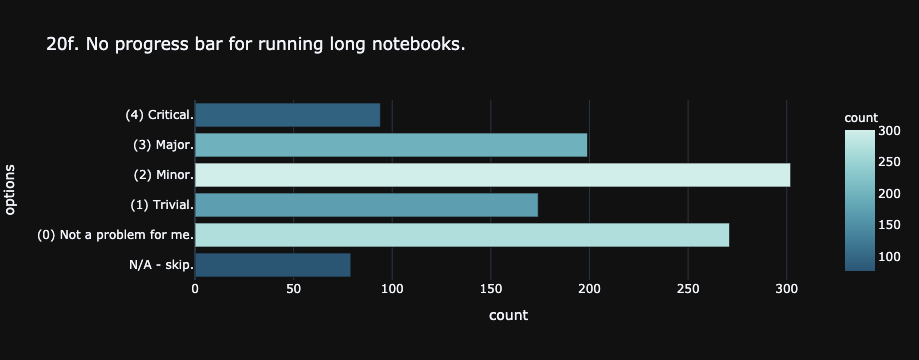

In [289]:
px.bar(q20f, x='count', y='options', title=q20f_name, height=350, **counts_color_kwargs)

In [290]:
q20g_name = '20g. No global search.'

In [291]:
q20g = series_counts_to_frame(main_df=df, col_name=q20g_name)
q20g = q20g.reindex([4, 0, 3, 1, 2, 5])

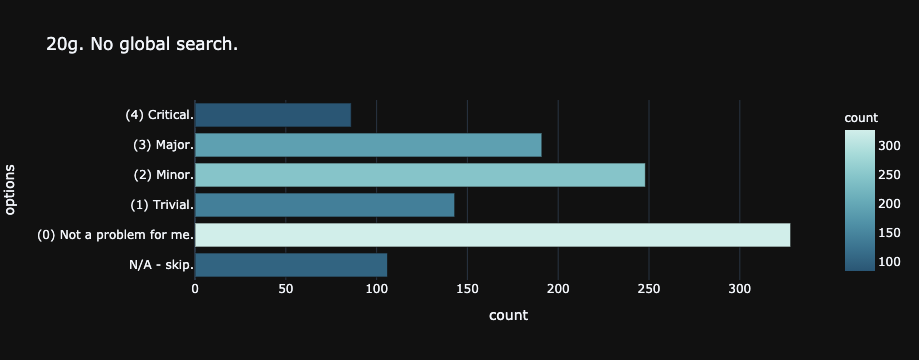

In [292]:
px.bar(q20g, x='count', y='options', title=q20g_name, height=350, **counts_color_kwargs)

In [293]:
q20h_name = '20h. No modes for editing other Jupyter\xa0documents (e.g. MyST, Jupyter Book).'

In [294]:
q20h = series_counts_to_frame(main_df=df, col_name=q20h_name)
q20h = q20h.reindex([1, 0, 3, 2, 4, 5])

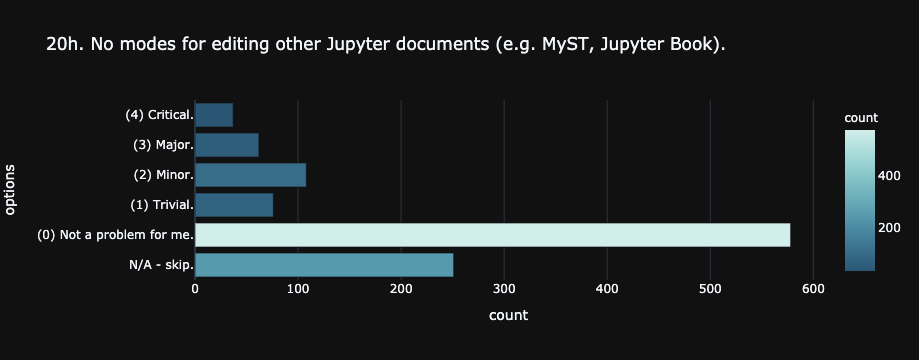

In [295]:
px.bar(q20h, x='count', y='options', title=q20h_name, height=350, **counts_color_kwargs)

In [296]:
q20i_name = '20i. No marketplace for Extensions (e.g. 5 star ratings, browsable categories).'

In [297]:
q20i = series_counts_to_frame(main_df=df, col_name=q20i_name)
q20i = q20i.reindex([4,0,3,1,2,5])

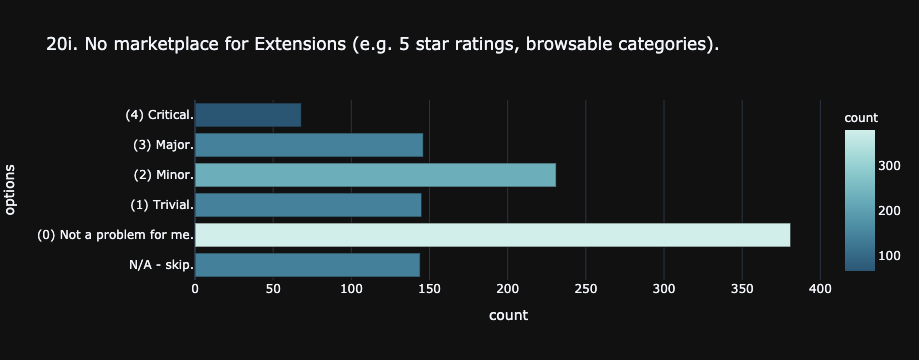

In [298]:
px.bar(q20i, x='count', y='options', title=q20i_name, height=350, **counts_color_kwargs)

---

In [299]:
df.columns.to_list()

['Respondent ID',
 '1. How frequently do you use Jupyter?',
 '2. How long have you been using Jupyter?',
 '3. Python.',
 '3. R.',
 '3. Spark SQL.',
 '3. SQL.',
 '3. Java.',
 '3. Scala.',
 '3. C (and derivatives).',
 '3. JavaScript.',
 '3. NodeJS.',
 '3. TypeScript.',
 '3. PHP.',
 '3. Ruby.',
 '3. Go.',
 '3. Rust.',
 '3. Groovy.',
 '3. Perl.',
 '3. Julia.',
 '3. I wrap/ use bindings for other languages.',
 '3. My preferred language is not supported in Jupyter.',
 '4. Data engineer.',
 '4. Data scientist.',
 '4. Scientist/ researcher.',
 '4. Teacher/ lecturer.',
 '4. Tutor/\xa0teaching assistant.',
 '4. Financial modeler/ analyst.',
 '4. Business analyst.',
 '4. Backend engineer.',
 '4. Front end/ web development.',
 '4. DevOps.',
 '4. Database Admin (DBA).',
 '4. Infrastructure engineer/ cloud architect.',
 '4. Sysadmin.',
 '4. Student.',
 '5. JupyterLab.',
 '5. Jupyter Notebook - Classic.',
 '5. PyCharm.',
 '5. Spyder.',
 '5. RStudio.',
 '5. nteract.',
 '5. VS Code.',
 '5. Zeppelin.',


In [300]:
weighted_pain_qs = [
    '10a. Data is too big to fit into memory on my machine/ server.',
    '10b. Lost data\xa0during failure or restart of kernel/ server.',
    '10c. Can’t see a list of my current variables.',
    '10d. No grid\xa0view for\xa0manipulating/ filtering\xa0dataframes and arrays.',
    '10e. Poor\xa0MVC/ ORM integrations (e.g. Django, Flask).',
    '10f. Plaintext\xa0or environment variable management\xa0of database passwords/ keys/ secrets.',
    '13a. No built-in UI for creating charts.',
    "13b. Can't publish my charts as web-based dashboards.",
    '13c. Poor/ buggy support for my plotting tool.',
    '13d. Difficulty displaying\xa0highly dimensional data (e.g. array of array of arrays, too many rows/ columns to fit on screen).',
    '13e. Lacking\xa0templating support (e.g. Jinja2).',
    '15a. Figuring out how to schedule batch execution of notebook-based jobs.',
    '15b. Don’t have the budget for more scalable environment/ cloud services.',
    '15c. Haven’t divided longer notebooks into multiple, modular notebooks.',
    '15d. Not persisting the outputs of a notebook.',
    '15e. Machine learning training jobs take too long.',
    "15f. Can't call code/ modules from other notebooks.",
    '15g. Difficulty managing\xa0Spark dependencies (Java).',
    "19a. Don't know what\xa0dependencies (versions of language, packages, extensions)\xa0a notebook uses.",
    "19b. Don't know/ have the data a notebook is supposed to use.",
    '19c. Poor\xa0support for\xa0our version control (git) system.',
    '19d. No built-in\xa0way\xa0to publish my notebook to a shared location.',
    '19e. Not being able to comment on notebooks.',
    '19f. No "track changes;" can\'t figure out what changed between notebook checkpoints/ versions.',
    '20a. Poor autocompletion (e.g. LSP, show methods/ attributes).',
    '20b. No native desktop app.',
    "20c. Can't collapse sections of a notebook hierarchically.",
    "20d. Can't see hidden `.` files in file browser.",
    "20e. Don't know which cell failed in long notebook.",
    '20f. No progress bar for running long notebooks.',
    '20g. No global search.',
    '20h. No modes for editing other Jupyter\xa0documents (e.g. MyST, Jupyter Book).',
    '20i. No marketplace for Extensions (e.g. 5 star ratings, browsable categories).',
]

In [325]:
weighted_points = []

In [326]:
for q in weighted_pain_qs:
    # df of counts in memory for each question.
    q_df = 'q' + q[:3]
    q_df = globals()[q_df]
    
    val_crit = q_df.loc[q_df['options'] == '(4) Critical.']['count'].to_list()[0]
    val_major = q_df.loc[q_df['options'] == '(3) Major.']['count'].to_list()[0]
    # some of the characters got messed up.
    val_minor = q_df.loc[(q_df['options'] == '(2) Minor.') | (q_df['options'] == '(2)\xa0Minor.')]['count'].to_list()[0]
    val_triv = q_df.loc[(q_df['options'] == '(1) Trivial.') | (q_df['options'] == '(1)\xa0Trivial.')]['count'].to_list()[0]
        
    val_crit = val_crit * 4
    val_major = val_major * 3
    val_minor = val_minor * 2
    val_triv = val_triv
    
    point_total = sum([val_crit, val_major, val_minor, val_triv])
    
    record = {"question":q[:65], "points":point_total}
    weighted_points.append(record)

In [327]:
weighted_df = pd.DataFrame.from_records(weighted_points).sort_values('points')

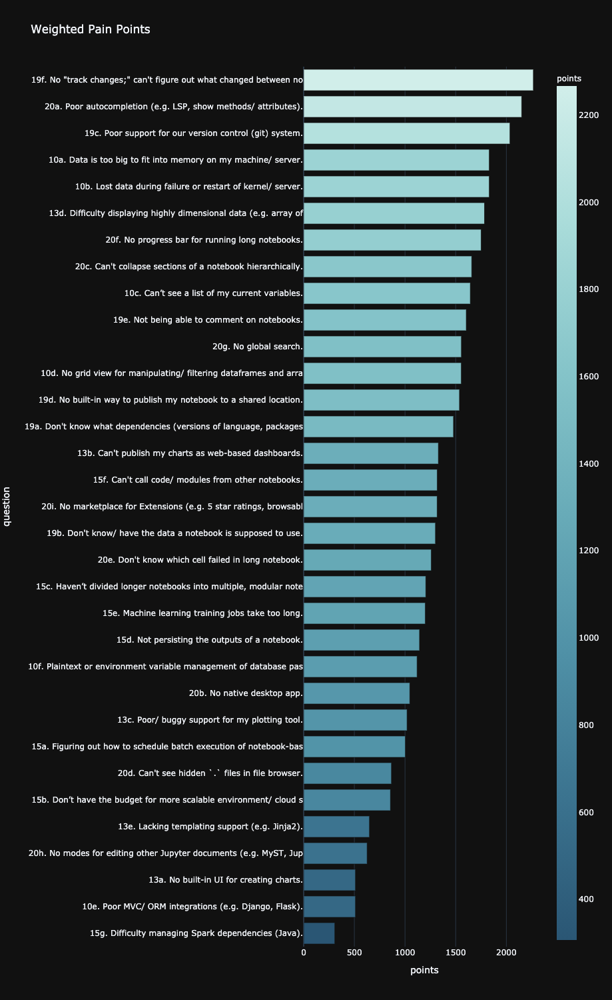

In [328]:
px.bar(weighted_df, x='points', y='question', title='Weighted Pain Points', height=1500, width=900, **points_color_kwargs)

In [365]:
freq_qs = [   
    '7a1. Writing a software package.',
    '7b1. Cleaning and preparing data.',
    '7c1. Writing and running tests for software.',
    '7d1. Building a machine learning or statistical model.',
    '7e1. Visualize data in charts, plots, or dashboards.',
    '7f1. Creating content (e.g. blogs, books, education materials).',
    '7g1. Documenting research (e.g. reports, scientific papers).',
    '7h1. Run pipelines, workflows, or ETL (extract, transform, load) jobs.',
    '7i1. Writing software documentation.',
    '7j1. Finding extensions/ plugins to solve my problems.',
    '7k1. Developing extensions/ plugins to solve my problems.',
]

In [366]:
rated_frequencies = []

In [367]:
for q in freq_qs:
    # df of counts in memory for each question.
    qdf = 'q' + q[:3]
    qdf = globals()[qdf]   
    
    val_daily = qdf.loc[qdf['options'] == 'Daily.']['count'].to_list()[0]
    val_weekly = qdf.loc[qdf['options'] == 'Weekly.']['count'].to_list()[0]
    val_monthly = qdf.loc[qdf['options'] == 'Monthly.']['count'].to_list()[0]
    val_rarely = qdf.loc[qdf['options'] == 'Every few months.']['count'].to_list()[0]
    
    val_daily = val_daily * 81
    val_weekly = val_weekly * 27
    val_monthly = val_monthly * 9
    val_rarely = val_rarely * 3
    
    freq_total = sum([val_daily, val_weekly, val_monthly, val_rarely])
    
    record = {"question":q, "weighted_freq":freq_total}
    rated_frequencies.append(record)

In [376]:
freq_df = pd.DataFrame.from_records(rated_frequencies).sort_values('weighted_freq')

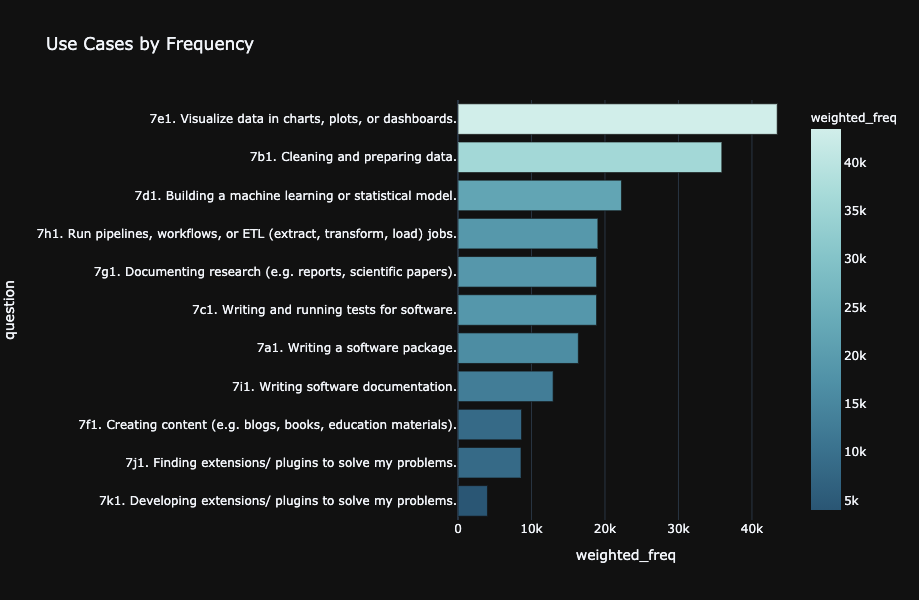

In [381]:
px.bar(freq_df, x='weighted_freq', y='question', title='Use Cases by Frequency', height=600, width=800, **freq_color_kwargs)

In [401]:
rated_compt = []

In [402]:
for q in freq_qs:
    qdf = 'q' + q[:2] + "_merged"
    qdf = globals()[qdf]
    
    points_jup_pro = qdf.loc[(qdf['tool'] == 'jupyter') & (qdf['options'] == 'Yes.')]['count'].to_list()[0]
    points_jup_con = qdf.loc[(qdf['tool'] == 'jupyter') & (qdf['options'] == 'No.')]['count'].to_list()[0]
    points_alt_pro = qdf.loc[(qdf['tool'] == 'alternative') & (qdf['options'] == 'Yes.')]['count'].to_list()[0]
    points_alt_con = qdf.loc[(qdf['tool'] == 'alternative') & (qdf['options'] == 'No.')]['count'].to_list()[0]
    
    jup_total = points_jup_pro - points_jup_con
    alt_total = points_alt_pro - points_alt_con
    
    points_total = jup_total - alt_total
    
    record = {"question":q, "points":points_total}
    rated_compt.append(record)

In [403]:
compt_df = pd.DataFrame.from_records(rated_compt).sort_values('points')

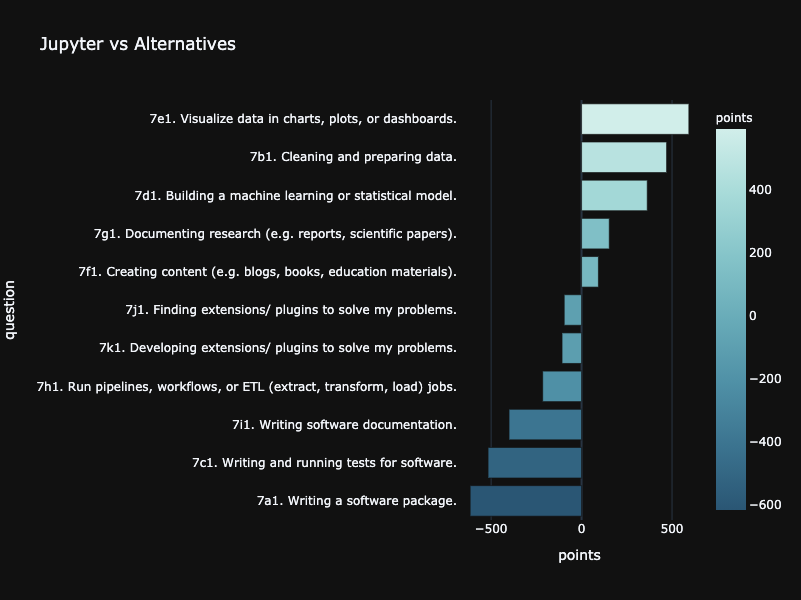

In [404]:
px.bar(compt_df, x='points', y='question', title='Jupyter vs Alternatives', height=600, width=800, **points_color_kwargs)